In [ ]:
import glob
import sys
import random
import warnings
 
import numpy as np
 
import matplotlib.pyplot as plt
 
import tensorflow as tf
 
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import *
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam

In [ ]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)
        
        
import tensorflow as tf
config = tf.compat.v1.ConfigProto(gpu_options = 
                         tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=0.8)
# device_count = {'GPU': 1}
)
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)
tf.compat.v1.keras.backend.set_session(session)

1 Physical GPUs, 1 Logical GPUs


In [ ]:
import tensorflow as tf
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2_as_graph
def get_flops(model, batch_size=None):
    if batch_size is None:
        batch_size = 1

    real_model = tf.function(model).get_concrete_function(tf.TensorSpec([batch_size] + model.inputs[0].shape[1:], model.inputs[0].dtype))
    frozen_func, graph_def = convert_variables_to_constants_v2_as_graph(real_model)

    run_meta = tf.compat.v1.RunMetadata()
    opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()
    flops = tf.compat.v1.profiler.profile(graph=frozen_func.graph,
                                            run_meta=run_meta, cmd='op', options=opts)
    return flops.total_float_ops

**Landcover Dataset**

In [ ]:
X_train = np.load('C:/Users/shyam/Desktop/pri/mini-dataset/X_train.npy')
y_train = np.load('C:/Users/shyam/Desktop/pri/mini-dataset/y_train.npy')
X_test = np.load('C:/Users/shyam/Desktop/pri/mini-dataset/X_test.npy')
y_test = np.load('C:/Users/shyam/Desktop/pri/mini-dataset/y_test.npy')

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(400, 512, 512, 3) (400, 512, 512, 1) (100, 512, 512, 3) (100, 512, 512, 1)


UNet SPP

In [ ]:
IMG_WIDTH = 512
IMG_HEIGHT = 512
IMG_CHANNELS = 3
def spp(x):
    pp1 = AveragePooling2D((2,2))(x)
    bn1 = BatchNormalization()(pp1)
    a1  = Activation('relu')(bn1)
    r1  = tf.keras.layers.experimental.preprocessing.Resizing(x.shape[1],x.shape[2])(a1)
    pp2 = AveragePooling2D((7,7))(x)
    bn2 = BatchNormalization()(pp2)
    a2  = Activation('relu')(bn2)
    r2  = tf.keras.layers.experimental.preprocessing.Resizing(x.shape[1],x.shape[2])(a2)
    pp3 = AveragePooling2D((14,14))(x)
    bn3 = BatchNormalization()(pp3)
    a3  = Activation('relu')(bn3)
    r3  = tf.keras.layers.experimental.preprocessing.Resizing(x.shape[1],x.shape[2])(a3)
    c   = concatenate([x,r1,r2,r3])
    return c

inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (inputs)
c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p2)
c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p3)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

p4 = spp(p4)
c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p4)
c5 = Dropout(0.4) (c5)
c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u7)
c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u8)
c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u9)
c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c9)

outputs = Conv2D(4, (1, 1), activation='softmax') (c9)

model = Model(inputs=[inputs], outputs=[outputs])

print(model.summary())

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Total params: 2,827,428
Trainable params: 2,826,660
Non-trainable params: 768
__________________________________________________________________________________________________
None
FLOPS: 104605171712


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback
 
model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/landcover_unetspp", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save_weights("C:/Users/shyam/Desktop/pri/landcover_unetspp.h5")

Epoch 1/100
100/100 [==============================] - 18s 155ms/step - loss: 1.0918 - acc: 0.5447 - val_loss: 0.9555 - val_acc: 0.5700
Epoch 2/100
100/100 [==============================] - 15s 153ms/step - loss: 0.8885 - acc: 0.6302 - val_loss: 0.8806 - val_acc: 0.5926
Epoch 3/100
100/100 [==============================] - 15s 152ms/step - loss: 0.7983 - acc: 0.6444 - val_loss: 0.8653 - val_acc: 0.6113
Epoch 4/100
100/100 [==============================] - 15s 153ms/step - loss: 0.8159 - acc: 0.6472 - val_loss: 0.9274 - val_acc: 0.6003
Epoch 5/100
100/100 [==============================] - 15s 154ms/step - loss: 0.8063 - acc: 0.6512 - val_loss: 0.8271 - val_acc: 0.6203
Epoch 6/100
100/100 [==============================] - 15s 155ms/step - loss: 0.7821 - acc: 0.6511 - val_loss: 0.8013 - val_acc: 0.6308
Epoch 7/100
100/100 [==============================] - 16s 158ms/step - loss: 0.7390 - acc: 0.6593 - val_loss: 0.7916 - val_acc: 0.6138
Epoch 8/100
100/100 [===========================

100/100 [==============================] - 15s 154ms/step - loss: 0.4288 - acc: 0.8301 - val_loss: 0.5105 - val_acc: 0.7965
Epoch 39/100
100/100 [==============================] - 16s 157ms/step - loss: 0.4376 - acc: 0.8258 - val_loss: 0.5211 - val_acc: 0.7968
Epoch 40/100
100/100 [==============================] - 15s 155ms/step - loss: 0.4180 - acc: 0.8322 - val_loss: 0.4894 - val_acc: 0.8015
Epoch 41/100
100/100 [==============================] - 16s 157ms/step - loss: 0.4079 - acc: 0.8382 - val_loss: 0.4680 - val_acc: 0.8140
Epoch 42/100
100/100 [==============================] - 16s 156ms/step - loss: 0.4165 - acc: 0.8325 - val_loss: 0.5135 - val_acc: 0.7925
Epoch 43/100
100/100 [==============================] - 16s 156ms/step - loss: 0.3986 - acc: 0.8422 - val_loss: 0.4757 - val_acc: 0.8165
Epoch 44/100
100/100 [==============================] - 16s 156ms/step - loss: 0.4045 - acc: 0.8397 - val_loss: 0.4934 - val_acc: 0.8074
Epoch 45/100
100/100 [==============================] 

In [ ]:
import numpy as np
from tensorflow.keras.metrics import MeanIoU, Accuracy
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, roc_curve, confusion_matrix, roc_auc_score, auc, f1_score, jaccard_score, classification_report
from sklearn.metrics import precision_score, recall_score, jaccard_score
from sklearn.metrics import confusion_matrix
import tensorflow as tf
import tensorflow

def parameters(cm,classes):
    cmr = np.sum(cm,axis =0)# rowwise sum
    cmc = np.sum(cm,axis =1)# columnwise sum
    kappa = []
    dice = []
    F1 = []
    iou =  []
    precision =  []
    recall = []
    acc = []
    for i in classes:
      TP = cm[i][i]
      FP = (cmr[i]-TP).astype(float)
      FN = (cmc[i]-TP).astype(float)
      TN = (np.sum(cm,axis=(0,1))-TP-FP-FN).astype(float)
#       print(TP,FP,FN,TN)
      ACC = ((TP+TN)/(TP+FP+FN+TN))
      acc.append(ACC)
      p_0 = ((TP+TN)/(TP+FP+FN+TN))
      P_a = (((FP+TN)/(TP+FP+FN+TN))*((FN+TN)/(TP+FP+FN+TN)))
      P_b = (((FN+TP)/(TP+FP+FN+TN))*((FP+TP)/(TP+FP+FN+TN)))
      pe = (P_a + P_b)
      κ = ((p_0-pe)/(1-pe))
      kappa.append(κ)
      re = TP/(TP+FN)
      recall.append(re)
      pr = TP/(TP+FP)
      precision.append(pr)
      f1 = 2*pr*re/(pr+re)
      F1.append(f1)
      IOU=TP/(TP+FP+FN)
      iou.append(IOU)
      dc=2*TP/(2*TP+FP+FN)
      dice.append(dc)
    k = np.mean(kappa)
    kappa.append(k)
    r = np.mean(recall)
    recall.append(r)
    p = np.mean(precision)
    precision.append(p)
    i = np.mean(iou)
    iou.append(i)
    d = np.mean(dice)
    dice.append(d)
    f = np.mean(F1)
    F1.append(f)
    a = np.mean(acc)
    acc.append(a)
    return kappa,recall,precision,iou,dice,F1,acc


def acc_osegnet(y_test,y_pred,classes):
    acc = []
    for cl in classes:
      r=0
      c=0
      for i in range(0,100):
        a1 = np.uint8(y_test[i] == cl)
        a2 = np.uint8(y_pred[i].argmax(axis=2) == cl)
        r = r + recall_score(y_true=a1.ravel(), y_pred=a2.ravel())
        if np.count_nonzero(y_test[i] == cl)!=0:
          c=c+1 
      r = r/c
      acc.append(r)
    a = np.mean(acc)
    acc.append(a)
    return acc

def get_mask(arr):
    map_dict = {'b': np.array([[[0, 0, 255]]]), 'g': np.array([[[0, 255, 0]]]), 'r': np.array([[[255, 0, 0]]])}
    mask = np.zeros((arr.shape[0], arr.shape[1], 3))
    mask[arr == 1, :] = map_dict['b']
    mask[arr == 2, :] = map_dict['g']
    mask[arr == 3, :] = map_dict['r']
    return mask

In [ ]:
y_pred = model.predict(X_test,batch_size =5)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(4, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.69207287
0.84597623
              precision    recall  f1-score   support

           0       0.83      0.68      0.75   1869012
           1       0.86      0.88      0.87  14704262
           2       0.84      0.79      0.82   1239101
           3       0.82      0.84      0.83   8402025

    accuracy                           0.85  26214400
   macro avg       0.84      0.80      0.82  26214400
weighted avg       0.85      0.85      0.85  26214400

k 0.7293323571421364


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.5042783099041999, 0.8425305424543841, 0.7514463228706806, 0.7525831265827665, 0.7127095754530077]
[[ 1277184   533019     6457    52352]
 [  211683 12868778   174818  1448983]
 [     701   250866   982089     5445]
 [   44610  1305565     3139  7048711]]
recall [0.6833471374180583, 0.8751733340986443, 0.7925818799274635, 0.838930019846406, 0.797508092822643]
precision [0.8324874949321396, 0.8603143366981704, 0.8419086791889948, 0.8238815282489339, 0.8396480097670597]
accuracy [0.9676200103759766, 0.8502756500244141, 0.9831609344482422, 0.8908960723876953, 0.922988166809082]
iou [0.6007433657289772, 0.7662855001919766, 0.6899042159724345, 0.7113583323115149, 0.6920728535512258]
dice [0.750580484780456, 0.8676802250923641, 0.8165009702345024, 0.8313376794101212, 0.8165248398793609]
f1 [0.750580484780456, 0.8676802250923641, 0.8165009702345023, 0.8313376794101213, 0.816524839879361]
kappa [0.733445752421357, 0.6953083531373602, 0.8076849670656505, 0.7507161891707664, 0.7467888154487835

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


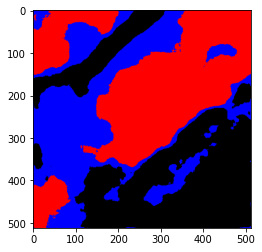

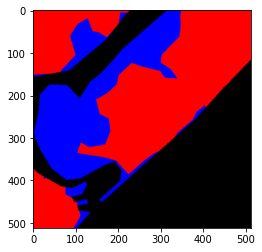

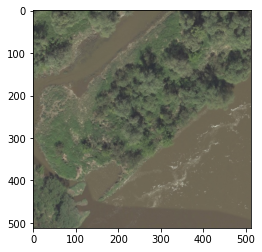

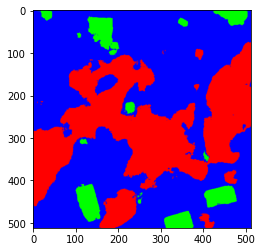

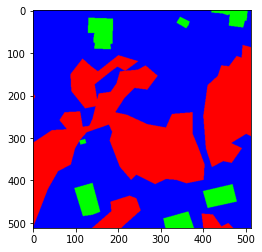

...

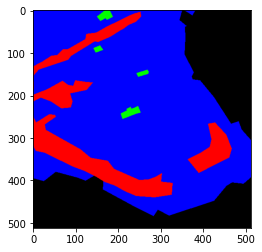

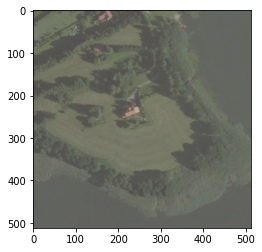

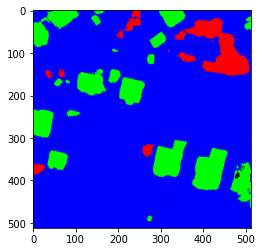

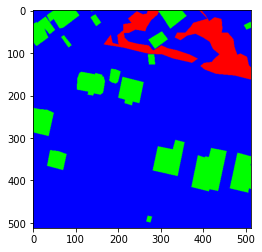

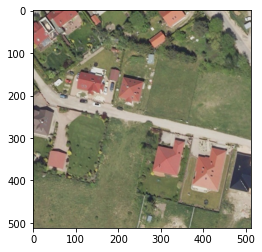

In [ ]:
for i in [18,21,25,15,99,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 512, 512, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = get_mask(test_img.reshape((512, 512)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow(get_mask(y_test[i,:,:].reshape((512, 512))))

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

UNet++

In [ ]:
dropout_rate = 0.5
from keras.layers import *
def conv_batchnorm_relu_block(input_tensor, nb_filter, kernel_size=3):

    x = Conv2D(nb_filter, (kernel_size, kernel_size), padding='same')(input_tensor)
    x = BatchNormalization(axis=2)(x)
    x = Activation('relu')(x)

    return x


def UnetPP(input_shape, n_labels, using_deep_supervision=False):

    nb_filter = [32,64,128,256,512]

    # Set image data format to channels first
    global bn_axis

    K.set_image_data_format("channels_last")
    bn_axis = -1
    inputs = Input(shape=input_shape, name='input_image')

    conv1_1 = conv_batchnorm_relu_block(inputs, nb_filter=nb_filter[0])
    pool1 = AvgPool2D((2, 2), strides=(2, 2), name='pool1')(conv1_1)

    conv2_1 = conv_batchnorm_relu_block(pool1, nb_filter=nb_filter[1])
    pool2 = AvgPool2D((2, 2), strides=(2, 2), name='pool2')(conv2_1)

    up1_2 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(conv2_1)
    conv1_2 = concatenate([up1_2, conv1_1], name='merge12', axis=bn_axis)
    conv1_2 = conv_batchnorm_relu_block(conv1_2,  nb_filter=nb_filter[0])

    conv3_1 = conv_batchnorm_relu_block(pool2, nb_filter=nb_filter[2])
    pool3 = AvgPool2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

    up2_2 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
    conv2_2 = concatenate([up2_2, conv2_1], name='merge22', axis=bn_axis)
    conv2_2 = conv_batchnorm_relu_block(conv2_2, nb_filter=nb_filter[1])

    up1_3 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
    conv1_3 = concatenate([up1_3, conv1_1, conv1_2], name='merge13', axis=bn_axis)
    conv1_3 = conv_batchnorm_relu_block(conv1_3, nb_filter=nb_filter[0])

    conv4_1 = conv_batchnorm_relu_block(pool3, nb_filter=nb_filter[3])
    pool4 = AvgPool2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

    up3_2 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
    conv3_2 = concatenate([up3_2, conv3_1], name='merge32', axis=bn_axis)
    conv3_2 = conv_batchnorm_relu_block(conv3_2, nb_filter=nb_filter[2])

    up2_3 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
    conv2_3 = concatenate([up2_3, conv2_1, conv2_2], name='merge23', axis=bn_axis)
    conv2_3 = conv_batchnorm_relu_block(conv2_3, nb_filter=nb_filter[1])

    up1_4 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
    conv1_4 = concatenate([up1_4, conv1_1, conv1_2, conv1_3], name='merge14', axis=bn_axis)
    conv1_4 = conv_batchnorm_relu_block(conv1_4, nb_filter=nb_filter[0])

    conv5_1 = conv_batchnorm_relu_block(pool4, nb_filter=nb_filter[4])

    up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
    conv4_2 = concatenate([up4_2, conv4_1], name='merge42', axis=bn_axis)
    conv4_2 = conv_batchnorm_relu_block(conv4_2, nb_filter=nb_filter[3])

    up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
    conv3_3 = concatenate([up3_3, conv3_1, conv3_2], name='merge33', axis=bn_axis)
    conv3_3 = conv_batchnorm_relu_block(conv3_3, nb_filter=nb_filter[2])

    up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
    conv2_4 = concatenate([up2_4, conv2_1, conv2_2, conv2_3], name='merge24', axis=bn_axis)
    conv2_4 = conv_batchnorm_relu_block(conv2_4, nb_filter=nb_filter[1])

    up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
    conv1_5 = concatenate([up1_5, conv1_1, conv1_2, conv1_3, conv1_4], name='merge15', axis=bn_axis)
    conv1_5 = conv_batchnorm_relu_block(conv1_5, nb_filter=nb_filter[0])

    nestnet_output_1 = Conv2D(n_labels, (1, 1), activation='softmax', name='output_1',padding='same')(conv1_2)
    nestnet_output_2 = Conv2D(n_labels, (1, 1), activation='softmax', name='output_2', padding='same' )(conv1_3)
    nestnet_output_3 = Conv2D(n_labels, (1, 1), activation='softmax', name='output_3', padding='same')(conv1_4)
    nestnet_output_4 = Conv2D(n_labels, (1, 1), activation='softmax', name='output_4', padding='same')(conv1_5)

    if using_deep_supervision:
        model = Model(input=inputs, output=[nestnet_output_1,
                                            nestnet_output_2,
                                            nestnet_output_3,
                                            nestnet_output_4])
    else:
        model = Model(inputs=inputs, outputs=nestnet_output_4)

    return model

model = UnetPP(input_shape = (512,512,3), n_labels=4)
model.summary()
flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Total params: 4,882,116
Trainable params: 4,873,860
Non-trainable params: 8,256
__________________________________________________________________________________________________
Instructions for updating:
Use `tf.compat.v1.graph_util.tensor_shape_from_node_def_name`
FLOPS: 664340025504


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/landcover_unet++", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save_weights("C:/Users/shyam/Desktop/pri/landcover_unet++.h5")

Epoch 1/100
100/100 [==============================] - 84s 746ms/step - loss: 0.9558 - acc: 0.6138 - val_loss: 0.9358 - val_acc: 0.5780
Epoch 2/100
100/100 [==============================] - 75s 749ms/step - loss: 0.8663 - acc: 0.6197 - val_loss: 0.8932 - val_acc: 0.6009
Epoch 3/100
100/100 [==============================] - 74s 740ms/step - loss: 0.8408 - acc: 0.6299 - val_loss: 0.8592 - val_acc: 0.5928
Epoch 4/100
100/100 [==============================] - 73s 730ms/step - loss: 0.8282 - acc: 0.6356 - val_loss: 0.8652 - val_acc: 0.5756
Epoch 5/100
100/100 [==============================] - 73s 729ms/step - loss: 0.8292 - acc: 0.6365 - val_loss: 0.8125 - val_acc: 0.6180
Epoch 6/100
100/100 [==============================] - 73s 728ms/step - loss: 0.7995 - acc: 0.6440 - val_loss: 0.8139 - val_acc: 0.6177
Epoch 7/100
100/100 [==============================] - 73s 729ms/step - loss: 0.7926 - acc: 0.6489 - val_loss: 0.8044 - val_acc: 0.6235
Epoch 8/100
100/100 [===========================

100/100 [==============================] - 73s 731ms/step - loss: 0.4755 - acc: 0.8072 - val_loss: 0.5456 - val_acc: 0.7722
Epoch 39/100
100/100 [==============================] - 73s 731ms/step - loss: 0.4721 - acc: 0.8080 - val_loss: 0.5386 - val_acc: 0.7794
Epoch 40/100
100/100 [==============================] - 73s 731ms/step - loss: 0.4709 - acc: 0.8099 - val_loss: 0.5655 - val_acc: 0.7679
Epoch 41/100
100/100 [==============================] - 73s 730ms/step - loss: 0.4570 - acc: 0.8156 - val_loss: 0.5115 - val_acc: 0.7915
Epoch 42/100
100/100 [==============================] - 73s 730ms/step - loss: 0.4548 - acc: 0.8165 - val_loss: 0.5312 - val_acc: 0.7835
Epoch 43/100
100/100 [==============================] - 73s 731ms/step - loss: 0.4522 - acc: 0.8178 - val_loss: 0.5486 - val_acc: 0.7779
Epoch 44/100
100/100 [==============================] - 73s 730ms/step - loss: 0.4492 - acc: 0.8161 - val_loss: 0.5312 - val_acc: 0.7795
Epoch 45/100
100/100 [==============================] 


Epoch 00074: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
Epoch 75/100
100/100 [==============================] - 73s 733ms/step - loss: 0.2702 - acc: 0.8897 - val_loss: 0.4740 - val_acc: 0.8289
Epoch 76/100
100/100 [==============================] - 73s 732ms/step - loss: 0.2670 - acc: 0.8911 - val_loss: 0.4623 - val_acc: 0.8305
Epoch 77/100
100/100 [==============================] - 73s 733ms/step - loss: 0.2652 - acc: 0.8917 - val_loss: 0.4640 - val_acc: 0.8298
Epoch 78/100
100/100 [==============================] - 73s 733ms/step - loss: 0.2638 - acc: 0.8922 - val_loss: 0.4706 - val_acc: 0.8303
Epoch 79/100
100/100 [==============================] - 73s 733ms/step - loss: 0.2631 - acc: 0.8925 - val_loss: 0.4701 - val_acc: 0.8310
Restoring model weights from the end of the best epoch.

Epoch 00079: ReduceLROnPlateau reducing learning rate to 1e-05.
Epoch 00079: early stopping


In [ ]:
y_pred = model.predict(X_test,batch_size =5)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(4, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.65539
0.82922363
              precision    recall  f1-score   support

           0       0.80      0.57      0.66   1869012
           1       0.84      0.88      0.86  14704262
           2       0.82      0.81      0.82   1239101
           3       0.82      0.80      0.81   8402025

    accuracy                           0.83  26214400
   macro avg       0.82      0.77      0.79  26214400
weighted avg       0.83      0.83      0.83  26214400

k 0.696753907769278


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.4753601201646291, 0.8532820717484824, 0.7726348206112422, 0.7343505468209298, 0.7089068898363209]
[[ 1062112   705926    16591    84383]
 [  237988 12912489   196630  1357155]
 [    5734   222363  1005343     5661]
 [   25877  1614038     4454  6757656]]
recall [0.5682745750161048, 0.8781460096399262, 0.8113487116869408, 0.8042889660528265, 0.7655145655989495]
precision [0.7975544243458228, 0.8354993679640055, 0.8220181550884779, 0.8236167488639349, 0.8196721740655603]
accuracy [0.9589348220825196, 0.8346672058105469, 0.9827791976928711, 0.8820660400390625, 0.91461181640625]
iou [0.4966363681847704, 0.7486981338744723, 0.6901150211151199, 0.6861104996698217, 0.6553900057110461]
dice [0.6636700520476155, 0.8562920259034444, 0.8166485860350373, 0.8138381201044387, 0.7876121960226339]
f1 [0.6636700520476155, 0.8562920259034443, 0.8166485860350374, 0.8138381201044387, 0.7876121960226341]
kappa [0.6424575617141308, 0.6619570535524373, 0.8076143100035278, 0.7275521194950497, 0.70989526119

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


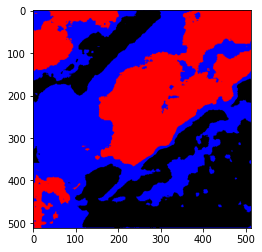

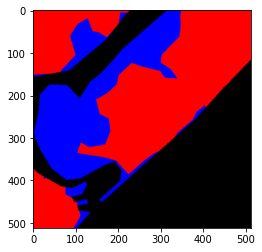

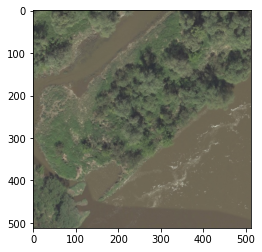

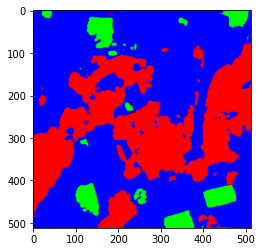

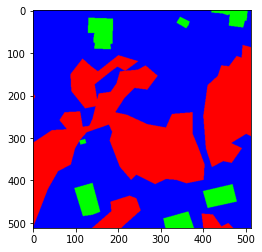

...

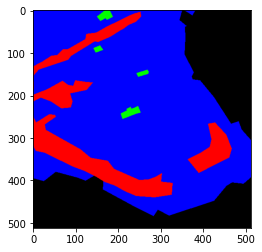

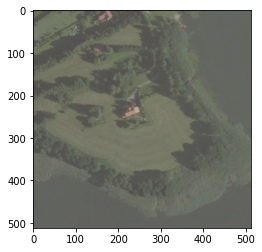

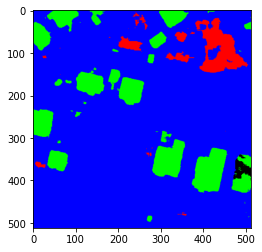

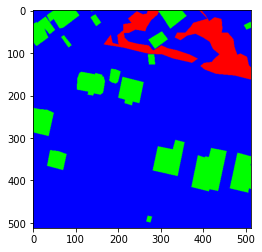

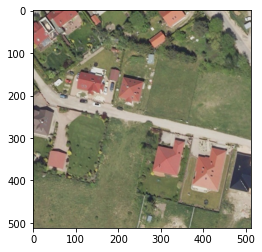

In [ ]:
for i in [18,21,25,15,99,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 512, 512, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = get_mask(test_img.reshape((512, 512)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow(get_mask(y_test[i,:,:].reshape((512, 512))))

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

Attention UNet

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import math
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K

def AttentionBlock(x,shortcut,i_filters):
    g1 = Conv2D(i_filters,kernel_size = 1)(shortcut) 
    g1 = BatchNormalization()(g1)
    x1 = Conv2D(i_filters,kernel_size = 1)(x) 
    x1 = BatchNormalization()(x1)

    g1_x1 = Add()([g1,x1])
    psi = Activation('relu')(g1_x1)
    psi = Conv2D(1,kernel_size = 1)(psi) 
    psi = BatchNormalization()(psi)
    psi = Activation('sigmoid')(psi)
    x = Multiply()([x,psi])
    return x

def attention_unet():
    seed = 42
    np.random.seed = seed

    IMG_WIDTH = 512
    IMG_HEIGHT = 512
    IMG_CHANNELS = 3

    inputs = Input((IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS))

    conv1 = Conv2D(16, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = Conv2D(16, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    drop5 = Dropout(0.5)(conv5)

    up6 = (UpSampling2D(size = (2,2),interpolation='bilinear')(drop5))
    drop4 = AttentionBlock(drop4,up6,128)
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)

    up7 = (UpSampling2D(size = (2,2),interpolation='bilinear')(conv6))
    conv3 = AttentionBlock(conv3,up7,64)
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)


    up8 = (UpSampling2D(size = (2,2),interpolation='bilinear')(conv7))
    conv2 = AttentionBlock(conv2,up8,32)
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)


    up9 = (UpSampling2D(size = (2,2),interpolation='bilinear')(conv8))
    conv1 = AttentionBlock(conv1,up9,16)
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(16, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    # conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv10 = Conv2D(4, (1, 1), activation='softmax')(conv9)

    model = Model(inputs = inputs, outputs = conv10)

    model.summary()
    return model

model = attention_unet()
flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d_15 (Conv2D)              (None, 512, 512, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_16 (Conv2D)              (None, 512, 512, 16) 2320        conv2d_15[0][0]                  
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 256, 256, 16) 0           conv2d_16[0][0]                  
______________________________________________________________________________________________

FLOPS: 80256253960


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/landcover_attunet", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save("C:/Users/shyam/Desktop/pri/landcover_attunet")

Epoch 1/100
100/100 [==============================] - 32s 213ms/step - loss: 1.1416 - acc: 0.5690 - val_loss: 0.9828 - val_acc: 0.5608
Epoch 2/100
100/100 [==============================] - 20s 199ms/step - loss: 0.8361 - acc: 0.6347 - val_loss: 0.8933 - val_acc: 0.5601
Epoch 3/100
100/100 [==============================] - 20s 199ms/step - loss: 0.8150 - acc: 0.6349 - val_loss: 0.8820 - val_acc: 0.5930
Epoch 4/100
100/100 [==============================] - 20s 199ms/step - loss: 0.7474 - acc: 0.6690 - val_loss: 0.8270 - val_acc: 0.5982
Epoch 5/100
100/100 [==============================] - 20s 200ms/step - loss: 0.7091 - acc: 0.6918 - val_loss: 0.8126 - val_acc: 0.6237
Epoch 6/100
100/100 [==============================] - 20s 200ms/step - loss: 0.7380 - acc: 0.6792 - val_loss: 1.0249 - val_acc: 0.5027
Epoch 7/100
100/100 [==============================] - 20s 201ms/step - loss: 0.7297 - acc: 0.6868 - val_loss: 0.7029 - val_acc: 0.7002
Epoch 8/100
100/100 [===========================

Epoch 38/100
100/100 [==============================] - 20s 203ms/step - loss: 0.3563 - acc: 0.8548 - val_loss: 0.4293 - val_acc: 0.8261
Epoch 39/100
100/100 [==============================] - 20s 202ms/step - loss: 0.3575 - acc: 0.8535 - val_loss: 0.4340 - val_acc: 0.8242
Epoch 40/100
100/100 [==============================] - 20s 201ms/step - loss: 0.3535 - acc: 0.8556 - val_loss: 0.4212 - val_acc: 0.8287
Epoch 41/100
100/100 [==============================] - 20s 201ms/step - loss: 0.3470 - acc: 0.8586 - val_loss: 0.4370 - val_acc: 0.8234
Epoch 42/100
100/100 [==============================] - 20s 202ms/step - loss: 0.3499 - acc: 0.8575 - val_loss: 0.4317 - val_acc: 0.8269
Epoch 43/100
100/100 [==============================] - 20s 202ms/step - loss: 0.3405 - acc: 0.8616 - val_loss: 0.4222 - val_acc: 0.8292
Epoch 44/100
100/100 [==============================] - 20s 203ms/step - loss: 0.3402 - acc: 0.8611 - val_loss: 0.4382 - val_acc: 0.8233
Epoch 45/100
100/100 [===================

In [ ]:
y_pred = model.predict(X_test,batch_size =5)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(4, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.6558172
0.8319092
              precision    recall  f1-score   support

           0       0.88      0.55      0.68   1869012
           1       0.86      0.86      0.86  14704262
           2       0.86      0.74      0.80   1239101
           3       0.78      0.87      0.82   8402025

    accuracy                           0.83  26214400
   macro avg       0.84      0.75      0.79  26214400
weighted avg       0.83      0.83      0.83  26214400

k 0.703595644761629


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.4282386726950564, 0.8199620834269606, 0.6998669180726711, 0.7994111771441399, 0.686869712834707]
[[ 1036903   691464    28558   112087]
 [  128744 12576448   115364  1883706]
 [     196   314453   915724     8728]
 [   16267  1104670     2163  7278925]]
recall [0.5547867001388969, 0.8552927035712503, 0.7390228883682606, 0.8663298431032995, 0.7538580337954268]
precision [0.8771628697836918, 0.8562959099641282, 0.8624187589293366, 0.7840757623839251, 0.8449883252652705]
accuracy [0.9627183532714844, 0.8383178329467773, 0.9820914459228516, 0.8806907272338867, 0.91595458984375]
iou [0.5147915891966067, 0.7479370168593248, 0.6610837822501816, 0.6994563806281162, 0.6558171922335574]
dice [0.6796863580020727, 0.8557940127650713, 0.795966813130457, 0.8231530842463851, 0.7886500670359965]
f1 [0.6796863580020727, 0.8557940127650713, 0.7959668131304571, 0.8231530842463852, 0.7886500670359966]
kappa [0.6609555222110026, 0.6718158409006125, 0.786659667277846, 0.7334693177612767, 0.71322508703768

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


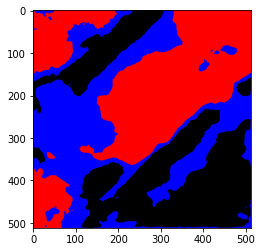

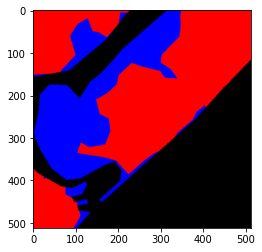

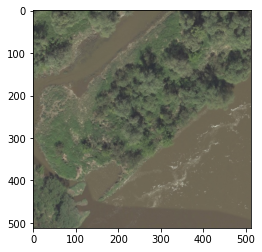

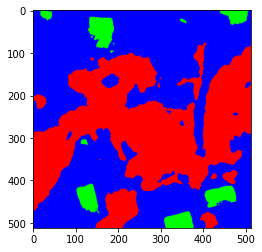

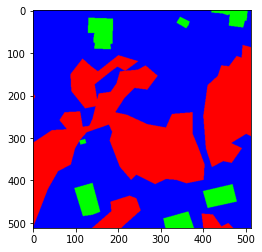

...

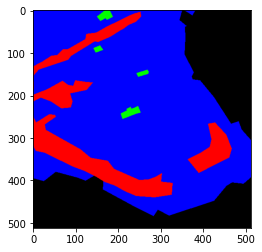

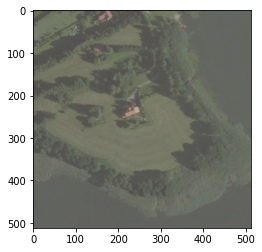

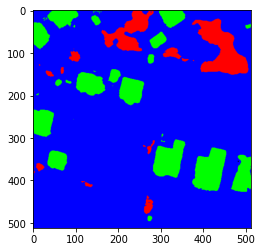

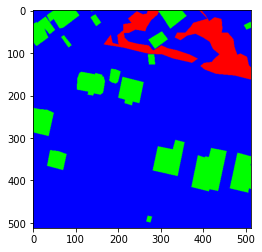

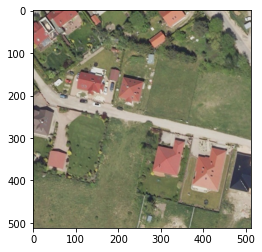

In [ ]:
for i in [18,21,25,15,99,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 512, 512, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = get_mask(test_img.reshape((512, 512)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow(get_mask(y_test[i,:,:].reshape((512, 512))))

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

DGR

In [ ]:
def dilconv(x,d,f):
  x1 = Conv2D(f,(1,1),dilation_rate=d)(x)
  x2 = Conv2D(f,(3,3),dilation_rate=d, padding='same')(x1)
  return x2

def dgspp(x,f):
  x1 = dilconv(x,3,f)
  x11 = x1+x
  x2 = dilconv(x11,6,f)
  x22 = x2+x1+x
  x3 = dilconv(x,12,f)
  x33 = x3+x2+x1+x
  # x4 = tf.math.reduce_mean(x, axis=None)
  x4 = tf.math.reduce_mean(x, axis=1, keepdims=True, name=None)
  x4 = tf.math.reduce_mean(x4, axis=2, keepdims=True, name=None)
  x4 = Conv2D(f,(1,1))(x4)
  x4 = tf.keras.layers.UpSampling2D(size=(32,32), interpolation='bilinear')(x4)
  x = concatenate([x4,x33],axis=3)
  return x

def res(x,f,d):
  x1 = Conv2D(f,(3,3),strides=(d,d),padding='same')(x)
  x2 = Conv2D(f,(1,1))(x1)
  x2 = Conv2D(f,(1,1))(x2)
  x3 = Conv2D(f,(1,1),strides=(d,d))(x)
  x= x2+x3
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  return x

def convset(x,f):
  x1 = Conv2D(f,(1,1))(x)
  x2 = Conv2D(f,(3,3), padding='same')(x1)
  x3 = Conv2D(f,(5,5), padding='same')(x2)
  return x3

from tensorflow.keras.layers import BatchNormalization, Activation, AveragePooling2D, DepthwiseConv2D, Conv2DTranspose
import tensorflow.keras.backend as K 
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import Activation,Reshape, Add, Multiply, DepthwiseConv2D, BatchNormalization, Concatenate, Conv2D, Dense,Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D, Input, Lambda,LeakyReLU, MaxPooling2D, Multiply, Permute, Reshape, UpSampling2D 
import collections
import tensorflow as tf

def dgrmodel(input_size, classes):
   inputs = Input(input_size)
   x1 = Conv2D(16,(7,7),strides=(2,2),padding='same')(inputs)
   r1 = res(x1,64,2)
   r2 = res(r1,128,2)
   r3 = res(r2,256,2)
   d = dgspp(r3,256)
   r4 = res(d,512,2)
   x2 = MaxPooling2D((2,2))(r4)
   conv1 = convset(x2,128)
   x3 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(conv1)
   conv2 = convset(x3,128)
   c1 = concatenate([conv2,r4],axis=3)
   conv3 = Conv2D(512,(7,7),padding='same')(c1)
   r5 = res(conv3,512,1)
   x4 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(r5)
   conv4 = convset(x4,128)
   c2 = concatenate([conv4,r3],axis=3)
   r6 = res(c2,512,1)
   x5 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(r6)
   r2 = Conv2D(512,(1,1))(r2)
   c3 = x5+r2
   r7 = res(c3,256,1)
   x6 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(r7)
   r1 = Conv2D(256,(1,1))(r1)
   c4 = x6+r1
   r8 = res(c4,128,1)
   x7 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(r8)
   x1 = Conv2D(128,(1,1))(x1)
   c5 = x7+x1
   r9 = res(c5,64,1)
   x8 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(r9)
   r10 = res(x8,16,1)
   x = Conv2D(classes,(1,1),activation='softmax')(r10)

  
   model = Model(inputs, x)
   

   opt = Adam(learning_rate=0.001)
   model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

   return model

model = dgrmodel((512,512,3), 4)

model.summary()

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 2368        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 64) 9280        conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 128, 128, 64) 4160        conv2d_1[0][0]                   
____________________________________________________________________________________________

FLOPS: 273338074126


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/landcover_dgr", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save("C:/Users/shyam/Desktop/pri/landcover_dgr")

Epoch 1/100
100/100 [==============================] - 50s 433ms/step - loss: 0.9103 - acc: 0.6289 - val_loss: 1.8786 - val_acc: 0.5571
Epoch 2/100
100/100 [==============================] - 44s 436ms/step - loss: 0.8024 - acc: 0.6535 - val_loss: 0.9431 - val_acc: 0.5483
Epoch 3/100
100/100 [==============================] - 44s 442ms/step - loss: 0.7852 - acc: 0.6671 - val_loss: 4.5205 - val_acc: 0.0914
Epoch 4/100
100/100 [==============================] - 44s 439ms/step - loss: 0.7687 - acc: 0.6736 - val_loss: 1.0278 - val_acc: 0.6139
Epoch 5/100
100/100 [==============================] - 44s 440ms/step - loss: 0.7448 - acc: 0.6878 - val_loss: 1.0310 - val_acc: 0.5737
Epoch 6/100
100/100 [==============================] - 44s 444ms/step - loss: 0.7213 - acc: 0.7018 - val_loss: 1.0718 - val_acc: 0.5888
Epoch 7/100
100/100 [==============================] - 44s 445ms/step - loss: 0.7304 - acc: 0.6935 - val_loss: 1.0650 - val_acc: 0.5472

Epoch 00007: ReduceLROnPlateau reducing learnin

Epoch 38/100
100/100 [==============================] - 44s 440ms/step - loss: 0.5209 - acc: 0.7923 - val_loss: 0.5316 - val_acc: 0.7846
Epoch 39/100
100/100 [==============================] - 44s 436ms/step - loss: 0.5373 - acc: 0.7875 - val_loss: 0.5348 - val_acc: 0.7837
Epoch 40/100
100/100 [==============================] - 58s 580ms/step - loss: 0.5207 - acc: 0.7908 - val_loss: 0.5369 - val_acc: 0.7836
Epoch 41/100
100/100 [==============================] - 43s 434ms/step - loss: 0.5288 - acc: 0.7881 - val_loss: 0.5491 - val_acc: 0.7752
Epoch 42/100
100/100 [==============================] - 51s 510ms/step - loss: 0.5246 - acc: 0.7909 - val_loss: 0.5433 - val_acc: 0.7818
Epoch 43/100
100/100 [==============================] - 51s 506ms/step - loss: 0.5292 - acc: 0.7903 - val_loss: 0.5531 - val_acc: 0.7776

Epoch 00043: ReduceLROnPlateau reducing learning rate to 1e-05.
Epoch 44/100
100/100 [==============================] - 43s 434ms/step - loss: 0.5221 - acc: 0.7930 - val_loss: 0

Epoch 75/100
100/100 [==============================] - 44s 436ms/step - loss: 0.4955 - acc: 0.8045 - val_loss: 0.5167 - val_acc: 0.7937
Epoch 76/100
100/100 [==============================] - 44s 435ms/step - loss: 0.4975 - acc: 0.8042 - val_loss: 0.5164 - val_acc: 0.7939
Epoch 77/100
100/100 [==============================] - 43s 435ms/step - loss: 0.5059 - acc: 0.8001 - val_loss: 0.5193 - val_acc: 0.7926
Epoch 78/100
100/100 [==============================] - 44s 437ms/step - loss: 0.4986 - acc: 0.8037 - val_loss: 0.5179 - val_acc: 0.7937
Epoch 79/100
100/100 [==============================] - 44s 435ms/step - loss: 0.5053 - acc: 0.8011 - val_loss: 0.5169 - val_acc: 0.7938
Epoch 80/100
100/100 [==============================] - 44s 436ms/step - loss: 0.4965 - acc: 0.8032 - val_loss: 0.5151 - val_acc: 0.7938
Epoch 81/100
100/100 [==============================] - 45s 447ms/step - loss: 0.4901 - acc: 0.8072 - val_loss: 0.5129 - val_acc: 0.7952
Epoch 82/100
100/100 [===================

In [ ]:
y_pred = model.predict(X_test,batch_size =5)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(4, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.56630254
0.796559
              precision    recall  f1-score   support

           0       0.84      0.42      0.56   1869012
           1       0.81      0.86      0.83  14704262
           2       0.79      0.60      0.68   1239101
           3       0.77      0.80      0.79   8402025

    accuracy                           0.80  26214400
   macro avg       0.80      0.67      0.71  26214400
weighted avg       0.80      0.80      0.79  26214400

k 0.6331082711994348


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.31222338514312137, 0.8329920166728516, 0.5756295452554668, 0.7261747269584395, 0.6117549185074699]
[[  785512   889945    38936   154619]
 [  137346 12628792   149361  1788763]
 [    6834   479612   738306    14349]
 [    3807  1660990     8522  6728706]]
recall [0.4202819457552974, 0.858852487802516, 0.5958400485513288, 0.8008433681166147, 0.6689544625564392]
precision [0.8414706389615844, 0.8064703114224681, 0.7895265338858442, 0.7746220918887686, 0.8030223940396664]
accuracy [0.9530224990844727, 0.8052209091186523, 0.9733881378173828, 0.8614864349365234, 0.8982794952392578]
iou [0.3894459045344098, 0.7120906686956707, 0.514169313053652, 0.6495042933443607, 0.5663025449070234]
dice [0.560577282301479, 0.831837567619203, 0.679143750465683, 0.7875145229570689, 0.7147682808358585]
f1 [0.560577282301479, 0.8318375676192029, 0.6791437504656829, 0.7875145229570688, 0.7147682808358584]
kappa [0.538665133241623, 0.6009749483011095, 0.6655449852354902, 0.6848115431650599, 0.622499152485820

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


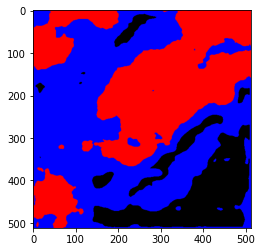

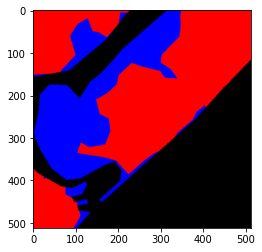

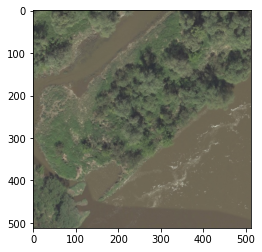

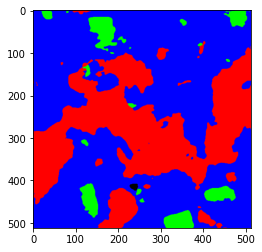

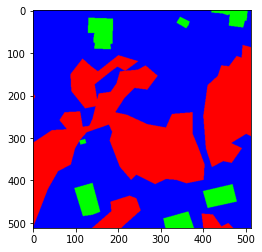

...

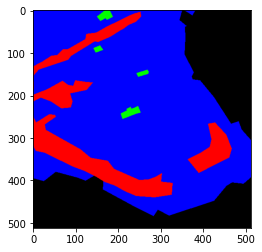

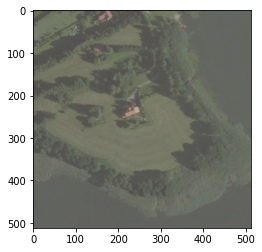

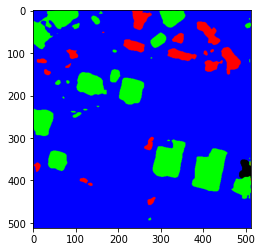

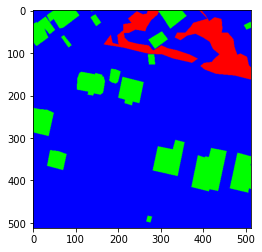

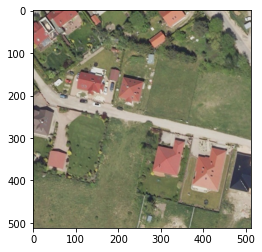

In [ ]:
for i in [18,21,25,15,99,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 512, 512, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = get_mask(test_img.reshape((512, 512)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow(get_mask(y_test[i,:,:].reshape((512, 512))))

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

UNet

In [ ]:
# UNet model
IMG_WIDTH = 512
IMG_HEIGHT = 512
IMG_CHANNELS = 3
num_classes = 4
inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

c1 = Conv2D(16, (3, 3), activation='relu',  padding='same') (inputs)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(16, (3, 3), activation='relu', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(32, (3, 3), activation='relu',  padding='same') (p1)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(32, (3, 3), activation='relu',  padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='relu', padding='same') (p2)
c3 = Dropout(0.2) (c3)
c3 = Conv2D(64, (3, 3), activation='relu',  padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(128, (3, 3), activation='relu',  padding='same') (p3)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(128, (3, 3), activation='relu',  padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = Conv2D(256, (3, 3), activation='relu',  padding='same') (p4)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(256, (3, 3), activation='relu',  padding='same') (c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(128, (3, 3), activation='relu', padding='same') (u6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(128, (3, 3), activation='relu', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='relu', padding='same') (u7)
c7 = Dropout(0.2) (c7)
c7 = Conv2D(64, (3, 3), activation='relu', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='relu', padding='same') (u8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(32, (3, 3), activation='relu', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='relu', padding='same') (u9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(16, (3, 3), activation='relu', padding='same') (c9)

outputs = Conv2D(num_classes, (1, 1), activation='softmax') (c9)
model = Model(inputs=[inputs], outputs=[outputs])
print(model.summary())

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d_10 (Conv2D)              (None, 512, 512, 16) 448         input_2[0][0]                    
__________________________________________________________________________________________________
dropout_5 (Dropout)             (None, 512, 512, 16) 0           conv2d_10[0][0]                  
__________________________________________________________________________________________________
conv2d_11 (Conv2D)              (None, 512, 512, 16) 2320        dropout_5[0][0]                  
______________________________________________________________________________________________

Instructions for updating:
Use `tf.compat.v1.graph_util.tensor_shape_from_node_def_name`
FLOPS: 97356087296


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/landcover_unet", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save("C:/Users/shyam/Desktop/pri/landcover_unet")

Epoch 1/100
100/100 [==============================] - 21s 170ms/step - loss: 1.0444 - acc: 0.5950 - val_loss: 1.0358 - val_acc: 0.5609
Epoch 2/100
100/100 [==============================] - 17s 168ms/step - loss: 0.9851 - acc: 0.6070 - val_loss: 1.0346 - val_acc: 0.5609
Epoch 3/100
100/100 [==============================] - 17s 169ms/step - loss: 0.9721 - acc: 0.6070 - val_loss: 1.0138 - val_acc: 0.5609
Epoch 4/100
100/100 [==============================] - 17s 169ms/step - loss: 0.9508 - acc: 0.6075 - val_loss: 0.9576 - val_acc: 0.5642
Epoch 5/100
100/100 [==============================] - 17s 169ms/step - loss: 0.8847 - acc: 0.6238 - val_loss: 0.9025 - val_acc: 0.5692
Epoch 6/100
100/100 [==============================] - 17s 171ms/step - loss: 0.8790 - acc: 0.6196 - val_loss: 0.9848 - val_acc: 0.5692
Epoch 7/100
100/100 [==============================] - 17s 174ms/step - loss: 0.8420 - acc: 0.6317 - val_loss: 0.8758 - val_acc: 0.5946
Epoch 8/100
100/100 [===========================

100/100 [==============================] - 17s 173ms/step - loss: 0.2651 - acc: 0.8945 - val_loss: 0.4456 - val_acc: 0.8326
Epoch 76/100
100/100 [==============================] - 17s 174ms/step - loss: 0.2534 - acc: 0.8987 - val_loss: 0.4546 - val_acc: 0.8298
Epoch 77/100
100/100 [==============================] - 18s 177ms/step - loss: 0.2502 - acc: 0.9000 - val_loss: 0.4492 - val_acc: 0.8313
Epoch 78/100
100/100 [==============================] - 17s 173ms/step - loss: 0.2463 - acc: 0.9016 - val_loss: 0.4519 - val_acc: 0.8319
Epoch 79/100
100/100 [==============================] - 17s 171ms/step - loss: 0.2435 - acc: 0.9026 - val_loss: 0.4606 - val_acc: 0.8317
Restoring model weights from the end of the best epoch.

Epoch 00079: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
Epoch 00079: early stopping
INFO:tensorflow:Assets written to: C:/Users/shyam/Desktop/pri/landcover_unet\assets


In [ ]:
y_pred = model.predict(X_test,batch_size =5)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(4, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.6451661
0.824352
              precision    recall  f1-score   support

           0       0.78      0.56      0.65   1869012
           1       0.84      0.86      0.85  14704262
           2       0.83      0.78      0.80   1239101
           3       0.81      0.83      0.82   8402025

    accuracy                           0.82  26214400
   macro avg       0.81      0.76      0.78  26214400
weighted avg       0.82      0.82      0.82  26214400

k 0.6894709946489725


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.4275974550050683, 0.8313616829227835, 0.743424918568473, 0.7675183339649799, 0.6924755976153262]
[[ 1044908   763196     3985    56923]
 [  255349 12665732   193705  1589476]
 [    6452   260882   964671     7096]
 [   27835  1434442     5165  6934583]]
recall [0.5590697116979452, 0.8613646846064087, 0.7785249144339323, 0.8253466277474776, 0.756076484621441]
precision [0.7829700631826302, 0.8374451840659624, 0.8262522633328937, 0.8074662340048612, 0.8135334361465868]
accuracy [0.9575141906738281, 0.8284511566162109, 0.9817930221557617, 0.8809457015991211, 0.9121760177612305]
iou [0.4840566873339238, 0.7379766287307035, 0.6690016893719365, 0.6896294771429026, 0.6451661206448666]
dice [0.652342584303193, 0.8492365392389309, 0.801678864236128, 0.8163085297364001, 0.7798916293786631]
f1 [0.652342584303193, 0.8492365392389309, 0.801678864236128, 0.8163085297364001, 0.7798916293786631]
kappa [0.6303867324021416, 0.6503460334609157, 0.7921462407284657, 0.7282583581329679, 0.700284341181122

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


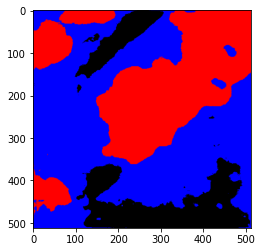

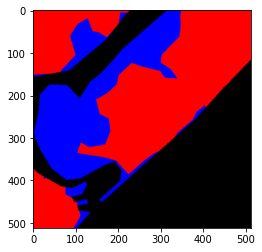

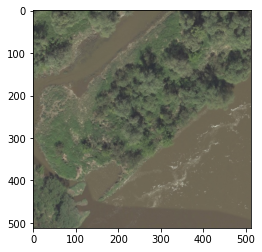

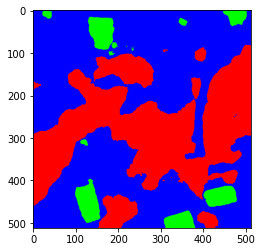

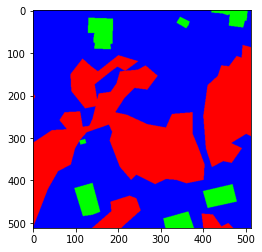

...

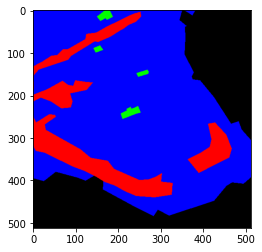

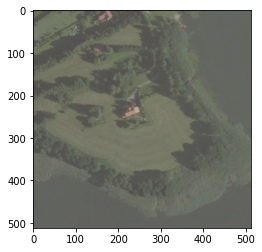

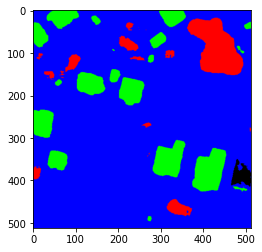

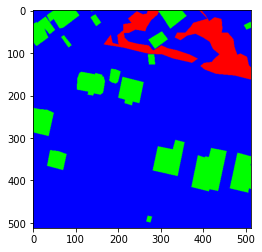

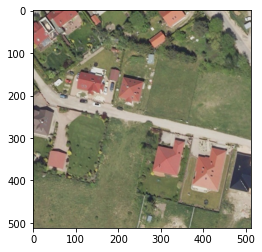

In [ ]:
for i in [18,21,25,15,99,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 512, 512, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = get_mask(test_img.reshape((512, 512)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow(get_mask(y_test[i,:,:].reshape((512, 512))))

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

FPN

In [ ]:
import numpy as np
from keras import layers
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D, UpSampling2D, Concatenate,Conv2DTranspose
from keras.models import Model, load_model
from keras.preprocessing import image
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from keras.applications.imagenet_utils import preprocess_input

from keras.utils.vis_utils import model_to_dot
# from keras.utils import plot_model

from keras.initializers import glorot_uniform
import scipy.misc


import keras.backend as K
def identity_block(X, f, filters, stage, block):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value. You'll need this later to add back to the main path. 
    X_shortcut = X
    
    # First component of main path
    X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
    
    # Second component of main path (≈3 lines)
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path (≈2 lines)
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation (≈2 lines)
    X = Add()([X, X_shortcut])
    X = Activation('relu',name = "Relu_"+conv_name_base)(X)      
    return X

def convolutional_block(X, f, filters, stage, block, s = 2):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value
    X_shortcut = X

    ##### MAIN PATH #####
    # First component of main path 
    X = Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    # Second component of main path (≈3 lines)
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path (≈2 lines)
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    ##### SHORTCUT PATH #### (≈2 lines)
    X_shortcut = Conv2D(filters = F3, kernel_size = (1, 1), strides = (s,s), padding = 'valid', name = conv_name_base + '1',
                        kernel_initializer = glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis = 3, name = bn_name_base + '1')(X_shortcut)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation (≈2 lines)
    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)   
    
    return X

def ResNet50(input_shape=(64, 64, 3), classes=4):
    
    # Define the input as a tensor with shape input_shape
    X_input = Input(input_shape)

    # Zero-Padding
    X = ZeroPadding2D((3, 3))(X_input)

    # Stage 1
    X = Conv2D(64, (7, 7), strides=(2, 2), name='conv1', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    # Stage 2
    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')

    ### START CODE HERE ###

    # Stage 3 (≈4 lines)
    X = convolutional_block(X, f = 3, filters = [128, 128, 512], stage = 3, block='a', s = 2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    # Stage 4 (≈6 lines)
    X = convolutional_block(X, f = 3, filters = [256, 256, 1024], stage = 4, block='a', s = 2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')

    # Stage 5 (≈3 lines)
    X = convolutional_block(X, f = 3, filters = [512, 512, 2048], stage = 5, block='a', s = 2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')

    # AVGPOOL (≈1 line). Use "X = AveragePooling2D(...)(X)"
    X = AveragePooling2D((2,2), name="avg_pool")(X)

    ### END CODE HERE ###

    # output layer
    X = Flatten()(X)
    X = Dense(classes, activation='softmax', name='fc' + str(classes), kernel_initializer = glorot_uniform(seed=0))(X)
    
    
    # Create model
    model = Model(inputs = X_input, outputs = X, name='ResNet50')

    return model

def FPN(height, width, channel, classes):    
    resnet50 = ResNet50(input_shape = (height, width, channel), classes = classes )
    #print(resnet50.summary())
    res2 = ZeroPadding2D(padding = ((1,0),(1,0)))(resnet50.get_layer('Relu_res2c_branch').output)
    res3 = resnet50.get_layer('Relu_res3d_branch').output
    res4 = resnet50.get_layer('Relu_res4f_branch').output
    res5 = resnet50.get_layer('Relu_res5c_branch').output
    print(res2.shape,res3.shape,res4.shape,res5.shape)
    dec4_1 = Conv2D(256,3,padding = 'same')(res5)  
    
    dec3 = UpSampling2D(2)(dec4_1)
    dec3_1 = Conv2D(256,1,padding = 'same')(res4)
    dec3_2 = Add()([dec3,dec3_1])
    print(dec3.shape,dec3_1.shape)
    
    dec2 = UpSampling2D(2)(dec3_2)
    dec2_1 = Conv2D(256,1,padding = 'same')(res3)
    print(dec2.shape,dec2_1.shape)
    dec2_2 = Add()([dec2,dec2_1]) 
    
    dec1 = UpSampling2D(2)(dec2_2)
    dec1_1 = Conv2D(256,1,padding = 'same')(res2)
    print(dec1.shape,dec1_1.shape)
    dec1_2 = Add()([dec1,dec1_1]) 
    
    dec4_3 = Conv2D(128,3,strides = 1,activation = 'relu', padding = 'same')(dec4_1)
    dec4_4 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec4_3)
    up_4 = UpSampling2D(8)(dec4_4)
    
    dec3_3 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec3_2)
    dec3_4 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec3_3)
    up_3 = UpSampling2D(4)(dec3_4)
    
    dec2_3 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec2_2)
    dec2_4 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec2_3)
    up_2 = UpSampling2D(2)(dec2_4)
    
    dec1_3 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec1_2)
    dec1_4 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec1_3)
    
    
    up = Concatenate()([up_4,up_3,up_2,dec1_4])
    
    final_3 = Conv2DTranspose(128,3,strides =2,activation = 'relu', padding = 'same')(up)
    final_2 = Conv2DTranspose(64,3,strides = 2,activation = 'relu', padding = 'same')(final_3)
    final_1 = Conv2D(classes,1,strides =1,activation = 'softmax', padding = 'same')(final_2)
    
    model = Model(inputs = [resnet50.input],outputs = [final_1])

    return model
NumChannels = 3
ImgHeight = 512
ImgWidth = 512
NumClass = 4

model = FPN(ImgHeight, ImgWidth, NumChannels, NumClass)
model.summary()

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

(None, 128, 128, 256) (None, 64, 64, 512) (None, 32, 32, 1024) (None, 16, 16, 2048)
(None, 32, 32, 256) (None, 32, 32, 256)
(None, 64, 64, 256) (None, 64, 64, 256)
(None, 128, 128, 256) (None, 128, 128, 256)
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 518, 518, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 256, 256, 64) 9472        zero_padding2d[0][0]             
____________________________________________________________________________________

FLOPS: 379359272716


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/landcover_fpn", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save("C:/Users/shyam/Desktop/pri/landcover_fpn")

Epoch 1/100
100/100 [==============================] - 78s 573ms/step - loss: 1.2064 - acc: 0.5855 - val_loss: 1.0273 - val_acc: 0.5610
Epoch 2/100
100/100 [==============================] - 54s 544ms/step - loss: 0.8028 - acc: 0.6664 - val_loss: 1.2426 - val_acc: 0.5611
Epoch 3/100
100/100 [==============================] - 55s 546ms/step - loss: 0.7834 - acc: 0.6625 - val_loss: 1.0649 - val_acc: 0.5785
Epoch 4/100
100/100 [==============================] - 54s 541ms/step - loss: 0.7569 - acc: 0.6878 - val_loss: 14.7019 - val_acc: 0.5626
Epoch 5/100
100/100 [==============================] - 54s 542ms/step - loss: 0.7433 - acc: 0.6958 - val_loss: 0.9474 - val_acc: 0.5879
Epoch 6/100
100/100 [==============================] - 55s 546ms/step - loss: 0.6613 - acc: 0.7295 - val_loss: 1.1475 - val_acc: 0.5815
Epoch 7/100
100/100 [==============================] - 56s 560ms/step - loss: 0.6940 - acc: 0.7192 - val_loss: 1.2642 - val_acc: 0.4492
Epoch 8/100
100/100 [==========================

Epoch 38/100
100/100 [==============================] - 55s 552ms/step - loss: 0.3470 - acc: 0.8581 - val_loss: 0.3998 - val_acc: 0.8381
Epoch 39/100
100/100 [==============================] - 55s 551ms/step - loss: 0.3313 - acc: 0.8644 - val_loss: 0.3809 - val_acc: 0.8448
Epoch 40/100
100/100 [==============================] - 55s 551ms/step - loss: 0.3447 - acc: 0.8574 - val_loss: 0.5620 - val_acc: 0.7826
Epoch 41/100
100/100 [==============================] - 55s 551ms/step - loss: 0.3593 - acc: 0.8533 - val_loss: 0.3791 - val_acc: 0.8450
Epoch 42/100
100/100 [==============================] - 55s 551ms/step - loss: 0.3418 - acc: 0.8578 - val_loss: 0.3849 - val_acc: 0.8434
Epoch 43/100
100/100 [==============================] - 55s 551ms/step - loss: 0.3181 - acc: 0.8677 - val_loss: 0.5548 - val_acc: 0.7900
Epoch 44/100
100/100 [==============================] - 55s 551ms/step - loss: 0.3404 - acc: 0.8627 - val_loss: 0.4051 - val_acc: 0.8337
Epoch 45/100
100/100 [===================

C:\Users\shyam\anaconda3\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


INFO:tensorflow:Assets written to: C:/Users/shyam/Desktop/pri/landcover_fpn\assets


In [ ]:
y_pred = model.predict(X_test,batch_size =5)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(4, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.7200165
0.8580992
              precision    recall  f1-score   support

           0       0.80      0.79      0.79   1869012
           1       0.87      0.88      0.88  14704262
           2       0.88      0.79      0.83   1239101
           3       0.84      0.84      0.84   8402025

    accuracy                           0.86  26214400
   macro avg       0.85      0.83      0.84  26214400
weighted avg       0.86      0.86      0.86  26214400

k 0.752078353979041


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.5757406089630992, 0.8535376743108648, 0.7400821443967561, 0.7585409285646331, 0.7319753390588383]
[[ 1469158   314969      395    84490]
 [  337654 12974702   129304  1262602]
 [     854   251352   979118     7777]
 [   26752  1302853      842  7071578]]
recall [0.7860612986968516, 0.8823769598229412, 0.7901841738486209, 0.8416516256497689, 0.8250685145045457]
precision [0.8008850763566429, 0.8740777678282949, 0.8823593554416267, 0.8392123038333951, 0.8491336258649899]
accuracy [0.9708132171630859, 0.8627191925048828, 0.9851026916503907, 0.8975633239746094, 0.9290496063232422]
iou [0.6575555706735796, 0.7828613209717044, 0.7148714773641579, 0.7247775777824377, 0.7200164866979699]
dice [0.7934039525520936, 0.878207757118232, 0.833731841482314, 0.8404301947318806, 0.8364434364711302]
f1 [0.7934039525520936, 0.8782077571182318, 0.833731841482314, 0.8404301947318805, 0.8364434364711301]
kappa [0.7777028472389953, 0.7209330284661508, 0.8259586358328604, 0.7650008989352091, 0.772398852618

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


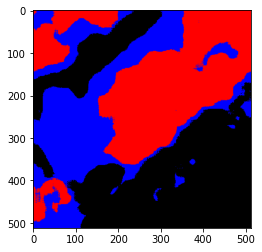

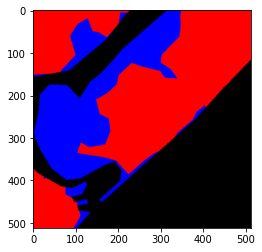

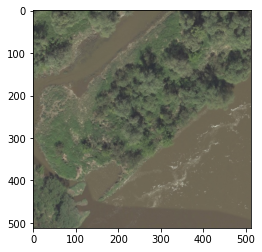

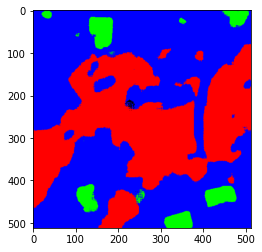

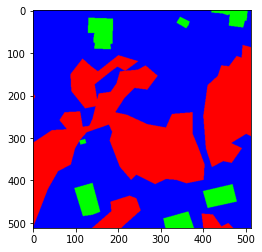

...

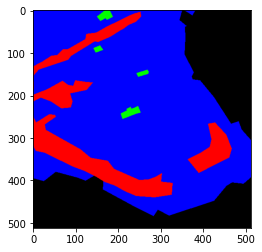

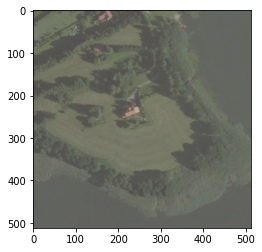

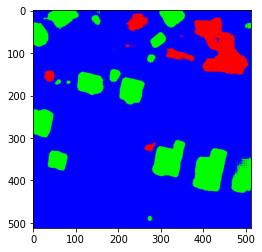

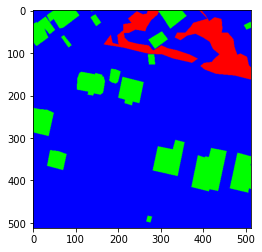

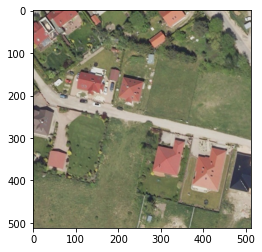

In [ ]:
for i in [18,21,25,15,99,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 512, 512, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = get_mask(test_img.reshape((512, 512)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow(get_mask(y_test[i,:,:].reshape((512, 512))))

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

Proposed Variant 0

In [ ]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, UpSampling2D, Concatenate, Input
from tensorflow.keras.models import Model

def batchnorm_relu(inputs):
     x = BatchNormalization()(inputs)
     x = Activation("relu")(x)
     return x

def residual_block(inputs, num_filters, strides=1):
     x = batchnorm_relu(inputs)
     x = Conv2D(num_filters, 3, padding="same", strides=strides)(x)
     x = batchnorm_relu(x)
     x = Conv2D(num_filters, 3, padding="same", strides=1)(x)
     s = Conv2D(num_filters, 1, padding="same", strides=strides)(inputs)
     x = x + s
     return x

def decoder_block(inputs, skip_features, num_filters):
    x = UpSampling2D((2, 2))(inputs) 
    x = Concatenate()([x, skip_features]) 
    x = residual_block(x, num_filters, strides=1) 
    return x

def build_resunet(input_shape):
    inputs = Input(input_shape)
    x = Conv2D(64, 3, padding="same", strides=1)(inputs) 
    x = batchnorm_relu(x) 
    x = Conv2D(64, 3, padding="same", strides=1)(x) 
    s = Conv2D(64, 1, padding="same")(inputs) 
    s1 = x + s
    s2 = residual_block(s1, 128, strides=2)
    s3 = residual_block(s2, 256, strides=2)
    b = residual_block(s3, 512, strides=2) 
    x = decoder_block(b, s3, 256) 
    x = decoder_block(x, s2, 128) 
    x = decoder_block(x, s1, 64)
    outputs = Conv2D(4, 1, padding="same", activation="softmax")(x)
    model = Model(inputs, outputs, name="RESUNET")
    return model

shape = (512,512, 3)
model = build_resunet(shape)
model.summary()


flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

Model: "RESUNET"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d_22 (Conv2D)              (None, 512, 512, 64) 1792        input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_13 (BatchNo (None, 512, 512, 64) 256         conv2d_22[0][0]                  
__________________________________________________________________________________________________
activation_13 (Activation)      (None, 512, 512, 64) 0           batch_normalization_13[0][0]     
____________________________________________________________________________________________

In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("/content/drive/MyDrive/mtech4sem/landcover_proposed_variant_0.h5", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save_weights("/content/drive/MyDrive/mtech4sem/landcover_proposed_variant_0.h5")

Epoch 1/100
100/100 [==============================] - 175s 1s/step - loss: 3.6084 - acc: 0.5673 - val_loss: 1.0012 - val_acc: 0.5610
Epoch 2/100
100/100 [==============================] - 123s 1s/step - loss: 1.0077 - acc: 0.6399 - val_loss: 0.9919 - val_acc: 0.5684
Epoch 3/100
100/100 [==============================] - 122s 1s/step - loss: 0.8266 - acc: 0.6583 - val_loss: 1.4529 - val_acc: 0.5609
Epoch 4/100
100/100 [==============================] - 122s 1s/step - loss: 0.7856 - acc: 0.6850 - val_loss: 1.1376 - val_acc: 0.5685
Epoch 5/100
100/100 [==============================] - 123s 1s/step - loss: 0.7829 - acc: 0.6833 - val_loss: 1.1796 - val_acc: 0.4821
Epoch 6/100
100/100 [==============================] - 123s 1s/step - loss: 0.7413 - acc: 0.6944 - val_loss: 0.8754 - val_acc: 0.5400
Epoch 7/100
100/100 [==============================] - 122s 1s/step - loss: 0.7065 - acc: 0.7078 - val_loss: 0.8333 - val_acc: 0.6375
Epoch 8/100
100/100 [==============================] - 123s 1s

In [ ]:
y_pred = model.predict(X_test,batch_size =5)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(4, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.6386825
0.82099694
              precision    recall  f1-score   support

           0       0.87      0.55      0.67   1869012
           1       0.83      0.87      0.85  14704262
           2       0.81      0.76      0.78   1239101
           3       0.80      0.80      0.80   8402025

    accuracy                           0.82  26214400
   macro avg       0.83      0.74      0.78  26214400
weighted avg       0.82      0.82      0.82  26214400

k 0.6810453933913478


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[0.4228908946301308, 0.8407698763938108, 0.725272785515055, 0.7268143087912032, 0.67893696633255]
[[ 1023215   700922    63281    81594]
 [  133287 12812806   159568  1598601]
 [    2451   291209   938075     7366]
 [   19162  1633580     1437  6747846]]
recall [0.5474630446460483, 0.8713668186815496, 0.7570609659745251, 0.803121390379105, 0.744753054920307]
precision [0.8685187778782207, 0.8299246618052757, 0.8070427345721338, 0.7999431444149642, 0.8263573296676486]
accuracy [0.9618264389038086, 0.8276837539672851, 0.9799609375, 0.8725227355957031, 0.9104984664916992]
iou [0.5055629889046559, 0.7393436793005967, 0.6410300214502384, 0.6687931496891943, 0.6386824598361713]
dice [0.6715932745829104, 0.8501409906498667, 0.7812532532265761, 0.8015291167916818, 0.7761291588127588]
f1 [0.6715932745829104, 0.8501409906498668, 0.7812532532265762, 0.8015291167916817, 0.7761291588127588]
kappa [0.6524313143167912, 0.6477331048568522, 0.7707639912964435, 0.7076377931852087, 0.6946415509138238]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


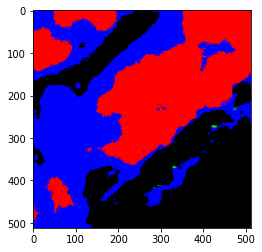

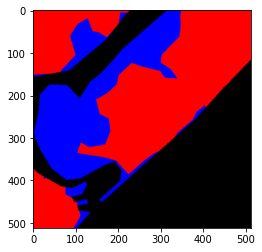

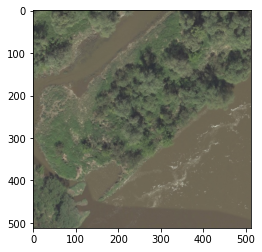

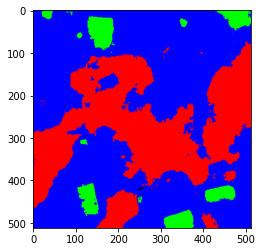

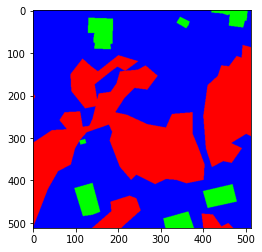

...

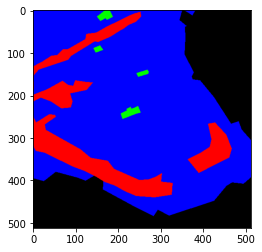

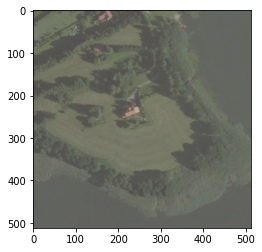

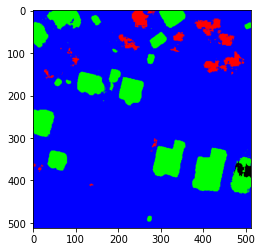

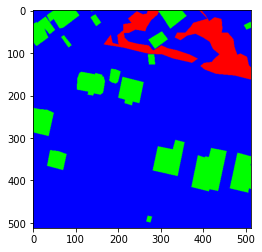

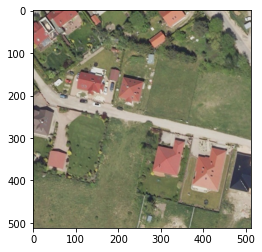

In [ ]:
for i in [18,21,25,15,99,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 512, 512, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = get_mask(test_img.reshape((512, 512)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow(get_mask(y_test[i,:,:].reshape((512, 512))))

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

Proposed Variant 1

In [ ]:
import tensorflow as tf

import numpy as np
from keras.backend import int_shape
from keras.models import Model
from keras.layers import *
from tensorflow.keras import regularizers
import tensorflow as tf

def dilconv(x,d,f):
  x1 = Conv2D(f,(1,1),dilation_rate=d)(x)
  x2 = Conv2D(f,(3,3),dilation_rate=d, padding='same')(x1)
  return x2

def dgspp(x,f):
  x1 = dilconv(x,7,f)
  x11 = x1+x
  x2 = dilconv(x11,14,f)
  x22 = x2+x1+x
  x3 = dilconv(x,21,f)
  x33 = x3+x2+x1+x
  x4 = tf.math.reduce_mean(x, axis=1, keepdims=True, name=None)
  x4 = tf.math.reduce_mean(x4, axis=2, keepdims=True, name=None)
  x4 = Conv2D(f,(1,1))(x4)
  x4 = tf.keras.layers.UpSampling2D(size=(128,128), interpolation='bilinear')(x4)
  x = concatenate([x4,x33],axis=3)
  return x

from tensorflow.keras import layers
from tensorflow import keras

img_size = (512,512)

def downblock(filters, filter_size, previous_layer):
  x = layers.Conv2D(filters, filter_size, padding="same")(previous_layer)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)

  x = layers.Conv2D(filters, filter_size, padding="same")(x)

  
  residual = layers.Conv2D(filters, 1, padding="same")(previous_layer)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)
  p = layers.MaxPooling2D(2)(x)

  return x,p

def bottleneck(filters, filter_size, previous_layer):
  x = layers.Conv2D(filters, filter_size, padding="same")(previous_layer)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)
  x = layers.Conv2D(filters, filter_size, padding="same")(x)

  residual = layers.Conv2D(filters, 1, padding="same")(previous_layer)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual
  
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)

  return x

def upblock(filters, filter_size, previous_layer, layer_to_concat):
  x = layers.Conv2DTranspose(filters, filter_size, strides=2, padding="same")(previous_layer)       #upconvolution
  concat = layers.concatenate([x, layer_to_concat])                                                      #concatenation

  x = layers.Conv2D(filters, filter_size, padding="same")(concat)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)
  x = layers.Conv2D(filters, filter_size, padding="same")(x)
  x = layers.BatchNormalization()(x)

  residual = layers.Conv2D(filters, 1, padding="same")(concat)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual
  
  x = layers.Activation("relu")(x)

  return x

input_layer = layers.Input(shape = img_size + (3,))

conv1, pool1 = downblock(32, 3, input_layer)
conv2, pool2 = downblock(64, 3, pool1)
conv3, pool3 = downblock(128, 3, pool2)
tower_1 = Conv2D(256, (1,1), padding='same', activation='relu')(pool3)
tower_1 = Conv2D(256, (3,3), padding='same', activation='relu')(tower_1)
tower_2 = Conv2D(256, (1,1), padding='same', activation='relu')(pool3)
tower_2 = Conv2D(256, (5,5), padding='same', activation='relu')(tower_2)
tower_3 = MaxPooling2D((3,3), strides=(1,1), padding='same')(pool3)
tower_3 = Conv2D(256, (1,1), padding='same', activation='relu')(tower_3)
conv4 = keras.layers.concatenate([tower_1, tower_2, tower_3], axis = 3)

upconv1 = upblock(128, 3, conv4, conv3)
upconv2 = upblock(64, 3, upconv1, conv2)
upconv3 = upblock(32, 3, upconv2, conv1)

output_layer = layers.Conv2D(4, 1, padding="same", activation='softmax')(upconv3)
model = keras.Model(input_layer, output_layer)
model.summary()

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")


The following Variables were used a Lambda layer's call (tf.nn.convolution_22), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_49/kernel:0' shape=(1, 1, 128, 256) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.nn.bias_add_34), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_49/bias:0' shape=(256,) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.nn.convolution_23), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_50/kernel:0' shape=(3, 3, 256, 256) dtype=float32>
It is possible that this is

FLOPS: 393658499072


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/landcover_proposed_variant_1", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save_weights("C:/Users/shyam/Desktop/pri/landcover_proposed_variant_1.h5")

Epoch 1/100
100/100 [==============================] - 52s 479ms/step - loss: 0.8339 - acc: 0.6476 - val_loss: 1.1843 - val_acc: 0.5609
Epoch 2/100
100/100 [==============================] - 47s 474ms/step - loss: 0.7160 - acc: 0.7029 - val_loss: 1.9406 - val_acc: 0.5609
Epoch 3/100
100/100 [==============================] - 48s 477ms/step - loss: 0.6883 - acc: 0.7124 - val_loss: 0.9481 - val_acc: 0.6129
Epoch 4/100
100/100 [==============================] - 47s 472ms/step - loss: 0.6235 - acc: 0.7438 - val_loss: 1.0269 - val_acc: 0.6289
Epoch 5/100
100/100 [==============================] - 48s 483ms/step - loss: 0.5940 - acc: 0.7585 - val_loss: 0.9782 - val_acc: 0.6056
Epoch 6/100
100/100 [==============================] - 48s 482ms/step - loss: 0.5629 - acc: 0.7703 - val_loss: 0.7580 - val_acc: 0.6548
Epoch 7/100
100/100 [==============================] - 47s 474ms/step - loss: 0.5576 - acc: 0.7743 - val_loss: 0.7465 - val_acc: 0.6875
Epoch 8/100
100/100 [===========================

Epoch 38/100
100/100 [==============================] - 48s 485ms/step - loss: 0.3004 - acc: 0.8779 - val_loss: 0.3571 - val_acc: 0.8555
Epoch 39/100
100/100 [==============================] - 48s 484ms/step - loss: 0.3086 - acc: 0.8765 - val_loss: 0.3651 - val_acc: 0.8514
Epoch 40/100
100/100 [==============================] - 48s 484ms/step - loss: 0.3018 - acc: 0.8783 - val_loss: 0.3595 - val_acc: 0.8563
Epoch 41/100
100/100 [==============================] - 48s 485ms/step - loss: 0.3032 - acc: 0.8780 - val_loss: 0.3571 - val_acc: 0.8563
Epoch 42/100
100/100 [==============================] - 48s 485ms/step - loss: 0.3020 - acc: 0.8781 - val_loss: 0.3587 - val_acc: 0.8558
Epoch 43/100
100/100 [==============================] - 48s 485ms/step - loss: 0.2956 - acc: 0.8808 - val_loss: 0.3624 - val_acc: 0.8544

Epoch 00043: ReduceLROnPlateau reducing learning rate to 1e-05.
Epoch 44/100
100/100 [==============================] - 48s 484ms/step - loss: 0.2971 - acc: 0.8798 - val_loss: 0

In [ ]:
y_pred = model.predict(X_test,batch_size =5)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(4, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.71877277
0.8602027
              precision    recall  f1-score   support

           0       0.83      0.75      0.79   1869012
           1       0.87      0.89      0.88  14704262
           2       0.88      0.78      0.83   1239101
           3       0.84      0.85      0.84   8402025

    accuracy                           0.86  26214400
   macro avg       0.86      0.82      0.84  26214400
weighted avg       0.86      0.86      0.86  26214400

k 0.7545559176134801


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.577180470687949, 0.8590802820218856, 0.7543976075045887, 0.7651441314829489, 0.738950622924343]
[[ 1401436   380922    17011    69643]
 [  263046 13073808   114370  1253038]
 [    1964   258465   971587     7085]
 [   21396  1276770      992  7102867]]
recall [0.749827181419916, 0.8891169104576618, 0.7841063803515613, 0.8453756088561983, 0.8171065202713343]
precision [0.8303123159632241, 0.8721706821863827, 0.8800925758179644, 0.8423071417907076, 0.8562206789395697]
accuracy [0.9712378692626953, 0.8647075271606446, 0.9847455215454102, 0.8997145080566407, 0.9301013565063476]
iou [0.6501922132969103, 0.7866112159988266, 0.7084253875757032, 0.7298622627633495, 0.7187727699086974]
dice [0.788019974955396, 0.880562272255816, 0.8293313746419747, 0.8438385858506897, 0.8354380519259691]
f1 [0.788019974955396, 0.880562272255816, 0.8293313746419747, 0.8438385858506897, 0.8354380519259691]
kappa [0.7726352001660113, 0.7245947974755887, 0.8213751238475244, 0.7699806122715501, 0.7721464334401686

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


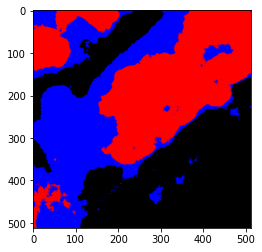

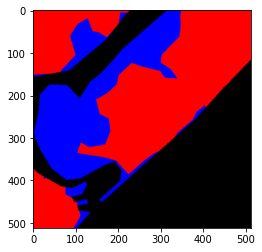

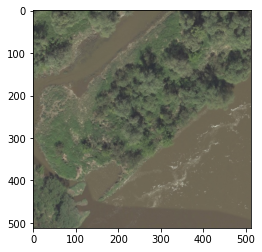

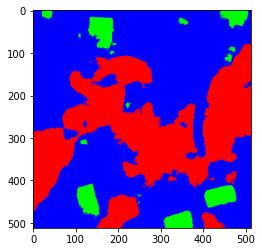

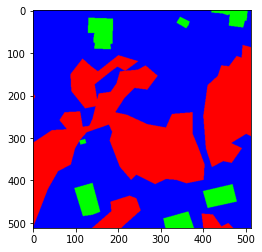

...

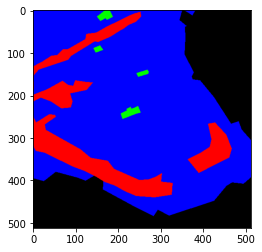

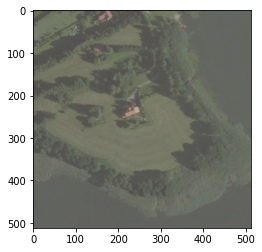

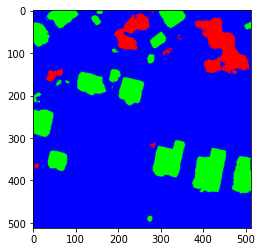

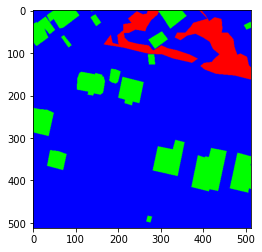

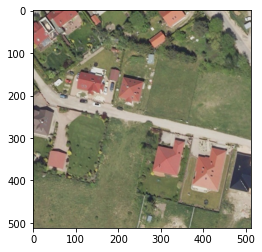

In [ ]:
for i in [18,21,25,15,99,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 512, 512, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = get_mask(test_img.reshape((512, 512)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow(get_mask(y_test[i,:,:].reshape((512, 512))))

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

DIResUNet

In [ ]:
import tensorflow as tf

import numpy as np
from keras.backend import int_shape
from keras.models import Model
from keras.layers import *
from tensorflow.keras import regularizers
import tensorflow as tf

def dilconv(x,d,f):
  x1 = Conv2D(f,(1,1),dilation_rate=d)(x)
  x2 = Conv2D(f,(3,3),dilation_rate=d, padding='same')(x1)
  return x2

def dgspp(x,f):
  x1 = dilconv(x,7,f)
  x11 = x1+x
  x2 = dilconv(x11,14,f)
  x22 = x2+x1+x
  x3 = dilconv(x,21,f)
  x33 = x3+x2+x1+x
  # x4 = tf.math.reduce_mean(x, axis=None)
  x4 = tf.math.reduce_mean(x, axis=1, keepdims=True, name=None)
  x4 = tf.math.reduce_mean(x4, axis=2, keepdims=True, name=None)
  x4 = Conv2D(f,(1,1))(x4)
  x4 = tf.keras.layers.UpSampling2D(size=(128,128), interpolation='bilinear')(x4)
  x = concatenate([x4,x33],axis=3)
  return x

from tensorflow.keras import layers
from tensorflow import keras

img_size = (512,512)

def downblock(filters, filter_size, previous_layer):
  x = layers.Conv2D(filters, filter_size, padding="same")(previous_layer)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)

  x = layers.Conv2D(filters, filter_size, padding="same")(x)

  
  residual = layers.Conv2D(filters, 1, padding="same")(previous_layer)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)
  p = layers.MaxPooling2D(2)(x)

  return x,p

def bottleneck(filters, filter_size, previous_layer):
  x = layers.Conv2D(filters, filter_size, padding="same")(previous_layer)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)
  x = layers.Conv2D(filters, filter_size, padding="same")(x)

  residual = layers.Conv2D(filters, 1, padding="same")(previous_layer)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual
  
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)

  return x

def upblock(filters, filter_size, previous_layer, layer_to_concat):
  x = layers.Conv2DTranspose(filters, filter_size, strides=2, padding="same")(previous_layer)       #upconvolution
  concat = layers.concatenate([x, layer_to_concat])                                                      #concatenation

  x = layers.Conv2D(filters, filter_size, padding="same")(concat)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)
  x = layers.Conv2D(filters, filter_size, padding="same")(x)
  x = layers.BatchNormalization()(x)

  residual = layers.Conv2D(filters, 1, padding="same")(concat)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual
  
  x = layers.Activation("relu")(x)

  return x

input_layer = layers.Input(shape = img_size + (3,))

conv1, pool1 = downblock(32, 3, input_layer)
conv2, pool2 = downblock(64, 3, pool1)
conv3, pool3 = downblock(128, 3, pool2)
conv3  = dgspp(conv3,128)
tower_1 = Conv2D(256, (1,1), padding='same', activation='relu')(pool3)
tower_1 = Conv2D(256, (3,3), padding='same', activation='relu')(tower_1)
tower_2 = Conv2D(256, (1,1), padding='same', activation='relu')(pool3)
tower_2 = Conv2D(256, (5,5), padding='same', activation='relu')(tower_2)
tower_3 = MaxPooling2D((3,3), strides=(1,1), padding='same')(pool3)
tower_3 = Conv2D(256, (1,1), padding='same', activation='relu')(tower_3)
conv4 = keras.layers.concatenate([tower_1, tower_2, tower_3], axis = 3)

upconv1 = upblock(128, 3, conv4, conv3)
upconv2 = upblock(64, 3, upconv1, conv2)
upconv3 = upblock(32, 3, upconv2, conv1)

output_layer = layers.Conv2D(4, 1, padding="same", activation='softmax')(upconv3)
model = keras.Model(input_layer, output_layer)
model.summary()

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")


The following Variables were used a Lambda layer's call (tf.compat.v1.nn.conv2d_12), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_54/kernel:0' shape=(1, 1, 128, 128) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.nn.bias_add_39), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_54/bias:0' shape=(128,) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.compat.v1.nn.conv2d_13), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_55/kernel:0' shape=(3, 3, 128, 128) dtype=float32>
It is possible th

The following Variables were used a Lambda layer's call (tf.nn.bias_add_49), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_64/bias:0' shape=(256,) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.nn.convolution_32), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_65/kernel:0' shape=(1, 1, 128, 256) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.nn.bias_add_50), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_65/bias:0' shape=(256,) dtype=float32>
It is possible that this is intended behav

FLOPS: 492391039490


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/landcover_DIResUNet", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save_weights("C:/Users/shyam/Desktop/pri/landcover_DIResUNet.h5")

Epoch 1/100
100/100 [==============================] - 62s 591ms/step - loss: 0.8477 - acc: 0.6343 - val_loss: 1.0113 - val_acc: 0.5609
Epoch 2/100
100/100 [==============================] - 59s 592ms/step - loss: 0.7425 - acc: 0.6841 - val_loss: 0.9534 - val_acc: 0.6005
Epoch 3/100
100/100 [==============================] - 59s 595ms/step - loss: 0.6969 - acc: 0.7065 - val_loss: 0.9543 - val_acc: 0.5660
Epoch 4/100
100/100 [==============================] - 60s 597ms/step - loss: 0.6373 - acc: 0.7424 - val_loss: 1.0126 - val_acc: 0.6090
Epoch 5/100
100/100 [==============================] - 60s 597ms/step - loss: 0.6359 - acc: 0.7371 - val_loss: 0.9020 - val_acc: 0.6689
Epoch 6/100
100/100 [==============================] - 60s 598ms/step - loss: 0.5978 - acc: 0.7610 - val_loss: 0.7975 - val_acc: 0.6559
Epoch 7/100
100/100 [==============================] - 60s 598ms/step - loss: 0.5492 - acc: 0.7769 - val_loss: 0.6181 - val_acc: 0.7418
Epoch 8/100
100/100 [===========================

Epoch 38/100
100/100 [==============================] - 60s 599ms/step - loss: 0.3138 - acc: 0.8715 - val_loss: 0.3440 - val_acc: 0.8563
Epoch 39/100
100/100 [==============================] - 60s 598ms/step - loss: 0.3091 - acc: 0.8735 - val_loss: 0.3524 - val_acc: 0.8542
Epoch 40/100
100/100 [==============================] - 60s 598ms/step - loss: 0.3067 - acc: 0.8738 - val_loss: 0.3534 - val_acc: 0.8552
Epoch 41/100
100/100 [==============================] - 60s 599ms/step - loss: 0.3084 - acc: 0.8741 - val_loss: 0.3387 - val_acc: 0.8606
Epoch 42/100
100/100 [==============================] - 60s 597ms/step - loss: 0.2988 - acc: 0.8770 - val_loss: 0.3490 - val_acc: 0.8544
Epoch 43/100
100/100 [==============================] - 60s 598ms/step - loss: 0.3048 - acc: 0.8752 - val_loss: 0.3622 - val_acc: 0.8512
Epoch 44/100
100/100 [==============================] - 60s 599ms/step - loss: 0.2963 - acc: 0.8778 - val_loss: 0.3592 - val_acc: 0.8511
Epoch 45/100
100/100 [===================

Epoch 75/100
100/100 [==============================] - 60s 598ms/step - loss: 0.2684 - acc: 0.8889 - val_loss: 0.3139 - val_acc: 0.8702
Epoch 76/100
100/100 [==============================] - 60s 599ms/step - loss: 0.2660 - acc: 0.8902 - val_loss: 0.3146 - val_acc: 0.8701
Epoch 77/100
100/100 [==============================] - 60s 598ms/step - loss: 0.2649 - acc: 0.8910 - val_loss: 0.3151 - val_acc: 0.8699
Epoch 78/100
100/100 [==============================] - 60s 600ms/step - loss: 0.2670 - acc: 0.8902 - val_loss: 0.3146 - val_acc: 0.8698
Epoch 79/100
100/100 [==============================] - 60s 598ms/step - loss: 0.2655 - acc: 0.8903 - val_loss: 0.3148 - val_acc: 0.8699
Epoch 80/100
100/100 [==============================] - 60s 598ms/step - loss: 0.2653 - acc: 0.8906 - val_loss: 0.3145 - val_acc: 0.8702
Epoch 81/100
100/100 [==============================] - 60s 598ms/step - loss: 0.2662 - acc: 0.8903 - val_loss: 0.3138 - val_acc: 0.8702
Epoch 82/100
100/100 [===================

In [ ]:
y_pred = model.predict(X_test,batch_size =5)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(4, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.75221264
0.8705101
              precision    recall  f1-score   support

           0       0.89      0.84      0.86   1869012
           1       0.89      0.89      0.89  14704262
           2       0.87      0.80      0.83   1239101
           3       0.84      0.85      0.85   8402025

    accuracy                           0.87  26214400
   macro avg       0.87      0.85      0.86  26214400
weighted avg       0.87      0.87      0.87  26214400

k 0.7738586306370794


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.6308392775621318, 0.8690844865299964, 0.7542518052154139, 0.7872075814431237, 0.7603457876876665]
[[ 1567632   230739     5449    65192]
 [  160659 13098166   142604  1302833]
 [     189   236578   994264     8070]
 [   28480  1211286     2422  7159837]]
recall [0.8387490288986909, 0.8907734369803803, 0.8024075519267598, 0.8521561171265261, 0.8460215337330893]
precision [0.8922411437938257, 0.8864025687888875, 0.8685508225018979, 0.8387879612911631, 0.8714956240939435]
accuracy [0.9812809753417969, 0.8746986770629883, 0.9849200439453125, 0.9001204299926758, 0.9352550315856935]
iou [0.7616001243720668, 0.7995039939595425, 0.7155160998750698, 0.7322304287531755, 0.7522126617399636]
dice [0.8646685633534953, 0.8885826279277682, 0.8341700785287604, 0.8454191966599042, 0.8582101166174819]
f1 [0.8646685633534953, 0.8885826279277682, 0.8341700785287604, 0.8454191966599041, 0.8582101166174819]
kappa [0.8546239690828605, 0.7454465519878098, 0.8262839071599809, 0.7716525277822193, 0.799501739

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


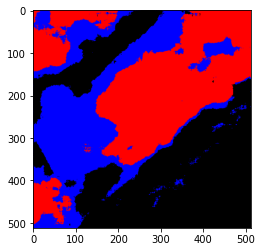

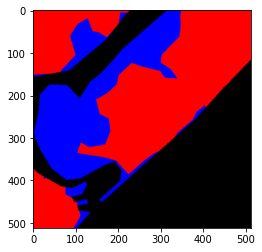

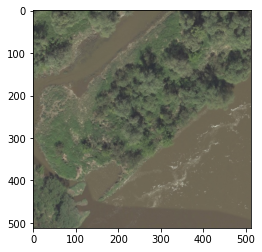

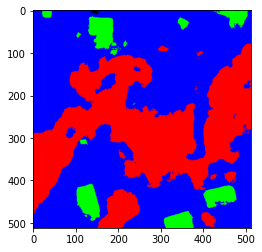

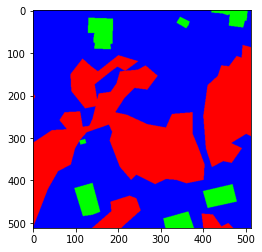

...

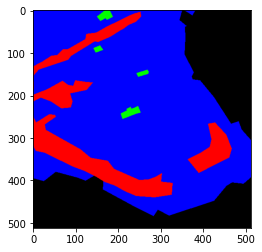

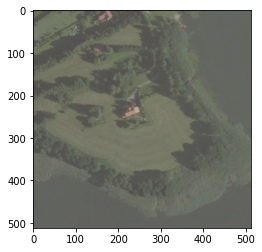

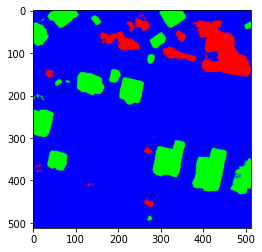

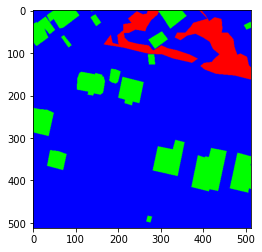

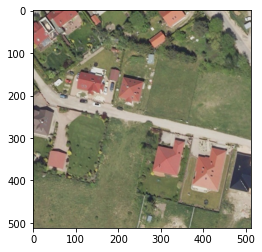

In [ ]:
for i in [18,21,25,15,99,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 512, 512, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = get_mask(test_img.reshape((512, 512)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow(get_mask(y_test[i,:,:].reshape((512, 512))))

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

**WHDLD Dataset**

In [ ]:
X_train = np.load('C:/Users/shyam/Desktop/pri/WHDLD/X_train.npy')
y_train = np.load('C:/Users/shyam/Desktop/pri/WHDLD/y_train.npy')
X_test = np.load('C:/Users/shyam/Desktop/pri/WHDLD/X_test.npy')
y_test = np.load('C:/Users/shyam/Desktop/pri/WHDLD/y_test.npy')

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(3703, 256, 256, 3) (3703, 256, 256, 1) (414, 256, 256, 3) (414, 256, 256, 1)


In [ ]:
import numpy as np
from tensorflow.keras.metrics import MeanIoU, Accuracy
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, roc_curve, confusion_matrix, roc_auc_score, auc, f1_score, jaccard_score, classification_report
from sklearn.metrics import precision_score, recall_score, jaccard_score
from sklearn.metrics import confusion_matrix
import tensorflow as tf
import tensorflow

def parameters(cm,classes):
    cmr = np.sum(cm,axis =0)
    cmc = np.sum(cm,axis =1)
    kappa = []
    dice = []
    F1 = []
    iou =  []
    precision =  []
    recall = []
    acc = []
    for i in classes:
      TP = cm[i][i]
      FP = (cmr[i]-TP).astype(float)
      FN = (cmc[i]-TP).astype(float)
      TN = (np.sum(cm,axis=(0,1))-TP-FP-FN).astype(float)
#       print(TP,FP,FN,TN)
      ACC = ((TP+TN)/(TP+FP+FN+TN))
      acc.append(ACC)
      p_0 = ((TP+TN)/(TP+FP+FN+TN))
      P_a = (((FP+TN)/(TP+FP+FN+TN))*((FN+TN)/(TP+FP+FN+TN)))
      P_b = (((FN+TP)/(TP+FP+FN+TN))*((FP+TP)/(TP+FP+FN+TN)))
      pe = (P_a + P_b)
      κ = ((p_0-pe)/(1-pe))
      kappa.append(κ)
      re = TP/(TP+FN)
      recall.append(re)
      pr = TP/(TP+FP)
      precision.append(pr)
      f1 = 2*pr*re/(pr+re)
      F1.append(f1)
      IOU=TP/(TP+FP+FN)
      iou.append(IOU)
      dc=2*TP/(2*TP+FP+FN)
      dice.append(dc)
    k = np.mean(kappa)
    kappa.append(k)
    r = np.mean(recall)
    recall.append(r)
    p = np.mean(precision)
    precision.append(p)
    i = np.mean(iou)
    iou.append(i)
    d = np.mean(dice)
    dice.append(d)
    f = np.mean(F1)
    F1.append(f)
    a = np.mean(acc)
    acc.append(a)
    return kappa,recall,precision,iou,dice,F1,acc


def acc_osegnet(y_test,y_pred,classes):
    acc = []
    for cl in classes:
      r=0
      c=0
      for i in range(0,100):
        a1 = np.uint8(y_test[i] == cl)
        a2 = np.uint8(y_pred[i].argmax(axis=2) == cl)
        r = r + recall_score(y_true=a1.ravel(), y_pred=a2.ravel())
        if np.count_nonzero(y_test[i] == cl)!=0:
          c=c+1 
      r = r/c
      acc.append(r)
    a = np.mean(acc)
    acc.append(a)
    return acc

color_dict = {
    0: [128, 128, 128],     # gray = bare soil
    1: [255, 0, 0],         # red = building
    2: [192, 192, 0],       # olive = pavement
    3: [255, 255, 0],       # yellow = road
    4: [0, 255, 0],         # green = vegetation
    5: [0, 0, 255],         # blue = water
}
 
def onehot_to_rgb(onehot,color_dict = color_dict):
    output = np.zeros(onehot.shape[:2]+(3,))
    for k in color_dict.keys():
        output[onehot==k]=color_dict[k]
    return output

UNet++

In [ ]:
dropout_rate = 0.5

def conv_batchnorm_relu_block(input_tensor, nb_filter, kernel_size=3):

    x = Conv2D(nb_filter, (kernel_size, kernel_size), padding='same')(input_tensor)
    x = BatchNormalization(axis=2)(x)
    x = Activation('relu')(x)

    return x


def UnetPP(input_shape, n_labels, using_deep_supervision=False):

    nb_filter = [32,64,128,256,512]

    # Set image data format to channels first
    global bn_axis

    K.set_image_data_format("channels_last")
    bn_axis = -1
    inputs = Input(shape=input_shape, name='input_image')

    conv1_1 = conv_batchnorm_relu_block(inputs, nb_filter=nb_filter[0])
    pool1 = AvgPool2D((2, 2), strides=(2, 2), name='pool1')(conv1_1)

    conv2_1 = conv_batchnorm_relu_block(pool1, nb_filter=nb_filter[1])
    pool2 = AvgPool2D((2, 2), strides=(2, 2), name='pool2')(conv2_1)

    up1_2 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(conv2_1)
    conv1_2 = concatenate([up1_2, conv1_1], name='merge12', axis=bn_axis)
    conv1_2 = conv_batchnorm_relu_block(conv1_2,  nb_filter=nb_filter[0])

    conv3_1 = conv_batchnorm_relu_block(pool2, nb_filter=nb_filter[2])
    pool3 = AvgPool2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

    up2_2 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
    conv2_2 = concatenate([up2_2, conv2_1], name='merge22', axis=bn_axis)
    conv2_2 = conv_batchnorm_relu_block(conv2_2, nb_filter=nb_filter[1])

    up1_3 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
    conv1_3 = concatenate([up1_3, conv1_1, conv1_2], name='merge13', axis=bn_axis)
    conv1_3 = conv_batchnorm_relu_block(conv1_3, nb_filter=nb_filter[0])

    conv4_1 = conv_batchnorm_relu_block(pool3, nb_filter=nb_filter[3])
    pool4 = AvgPool2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

    up3_2 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
    conv3_2 = concatenate([up3_2, conv3_1], name='merge32', axis=bn_axis)
    conv3_2 = conv_batchnorm_relu_block(conv3_2, nb_filter=nb_filter[2])

    up2_3 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
    conv2_3 = concatenate([up2_3, conv2_1, conv2_2], name='merge23', axis=bn_axis)
    conv2_3 = conv_batchnorm_relu_block(conv2_3, nb_filter=nb_filter[1])

    up1_4 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
    conv1_4 = concatenate([up1_4, conv1_1, conv1_2, conv1_3], name='merge14', axis=bn_axis)
    conv1_4 = conv_batchnorm_relu_block(conv1_4, nb_filter=nb_filter[0])

    conv5_1 = conv_batchnorm_relu_block(pool4, nb_filter=nb_filter[4])

    up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
    conv4_2 = concatenate([up4_2, conv4_1], name='merge42', axis=bn_axis)
    conv4_2 = conv_batchnorm_relu_block(conv4_2, nb_filter=nb_filter[3])

    up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
    conv3_3 = concatenate([up3_3, conv3_1, conv3_2], name='merge33', axis=bn_axis)
    conv3_3 = conv_batchnorm_relu_block(conv3_3, nb_filter=nb_filter[2])

    up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
    conv2_4 = concatenate([up2_4, conv2_1, conv2_2, conv2_3], name='merge24', axis=bn_axis)
    conv2_4 = conv_batchnorm_relu_block(conv2_4, nb_filter=nb_filter[1])

    up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
    conv1_5 = concatenate([up1_5, conv1_1, conv1_2, conv1_3, conv1_4], name='merge15', axis=bn_axis)
    conv1_5 = conv_batchnorm_relu_block(conv1_5, nb_filter=nb_filter[0])

    nestnet_output_1 = Conv2D(n_labels, (1, 1), activation='softmax', name='output_1',padding='same')(conv1_2)
    nestnet_output_2 = Conv2D(n_labels, (1, 1), activation='softmax', name='output_2', padding='same' )(conv1_3)
    nestnet_output_3 = Conv2D(n_labels, (1, 1), activation='softmax', name='output_3', padding='same')(conv1_4)
    nestnet_output_4 = Conv2D(n_labels, (1, 1), activation='softmax', name='output_4', padding='same')(conv1_5)

    if using_deep_supervision:
        model = Model(input=inputs, output=[nestnet_output_1,
                                            nestnet_output_2,
                                            nestnet_output_3,
                                            nestnet_output_4])
    else:
        model = Model(inputs=inputs, outputs=nestnet_output_4)

    return model

model = UnetPP(input_shape = (256,256,3), n_labels=6)
model.summary()
flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_27 (Conv2D)              (None, 256, 256, 32) 896         input_image[0][0]                
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 32) 1024        conv2d_27[0][0]                  
__________________________________________________________________________________________________
activation_37 (Activation)      (None, 256, 256, 32) 0           batch_normalization[0][0]        
____________________________________________________________________________________________

FLOPS: 166121711696


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/whdld_unet++", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save("C:/Users/shyam/Desktop/pri/whdld_unet++")

Epoch 1/100
926/926 [==============================] - 248s 259ms/step - loss: 1.1921 - acc: 0.5507 - val_loss: 1.0616 - val_acc: 0.5912
Epoch 2/100
926/926 [==============================] - 237s 256ms/step - loss: 0.8883 - acc: 0.6632 - val_loss: 0.7469 - val_acc: 0.7198
Epoch 3/100
926/926 [==============================] - 236s 255ms/step - loss: 0.8040 - acc: 0.6959 - val_loss: 0.7327 - val_acc: 0.7279
Epoch 4/100
926/926 [==============================] - 236s 255ms/step - loss: 0.7655 - acc: 0.7086 - val_loss: 0.7312 - val_acc: 0.7248
Epoch 5/100
926/926 [==============================] - 236s 255ms/step - loss: 0.7302 - acc: 0.7224 - val_loss: 0.7490 - val_acc: 0.7166
Epoch 6/100
926/926 [==============================] - 236s 255ms/step - loss: 0.7359 - acc: 0.7194 - val_loss: 0.6719 - val_acc: 0.7508
Epoch 7/100
926/926 [==============================] - 236s 255ms/step - loss: 0.6934 - acc: 0.7367 - val_loss: 0.6604 - val_acc: 0.7453
Epoch 8/100
926/926 [====================

In [ ]:
y_pred = model.predict(X_test)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(6, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3,4,5]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
classes = [0,1,2,3,4,5]
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.6086338
0.81494975
              precision    recall  f1-score   support

           0       0.61      0.49      0.55   1158900
           1       0.75      0.74      0.75   3717022
           2       0.62      0.56      0.59   3956927
           3       0.73      0.70      0.71   1248215
           4       0.86      0.91      0.89  13318156
           5       0.96      0.94      0.95   3732684

    accuracy                           0.81  27131904
   macro avg       0.76      0.73      0.74  27131904
weighted avg       0.81      0.81      0.81  27131904

k 0.7298049140831788


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.3135573203411673, 0.5635499581093895, 0.5121800924995832, 0.5945160260354597, 0.9048701638890922, 0.7467913211583633, 0.6059108136721759]
[[  571735    34282   231928    28093   275141    17721]
 [   24828  2745897   467291    13999   461631     3376]
 [  179024   511812  2229280   164771   864885     7155]
 [   28892    10378   177792   872523   154132     4498]
 [  126170   335392   465214   116804 12170218   104358]
 [    6986     1492     5104     3405   194211  3521486]]
recall [0.4933428250927604, 0.7387357406009435, 0.5633866887107091, 0.6990165956986577, 0.9138065359799059, 0.943419266136646, 0.7252846087032704]
precision [0.6097628608147093, 0.754522150562217, 0.6232942991531923, 0.7273479799432309, 0.8619001491336749, 0.9625244014503932, 0.7565586401762362]
accuracy [0.9648729038699237, 0.9312808640337221, 0.8866656759510869, 0.9740982424233846, 0.8858193660127944, 0.9871624932772871, 0.9383165909280331]
iou [0.37495737145855196, 0.5955904266418068, 0.4202813740513278, 0.5

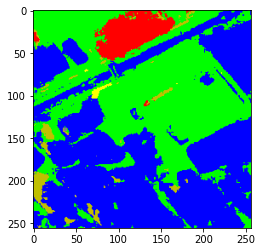

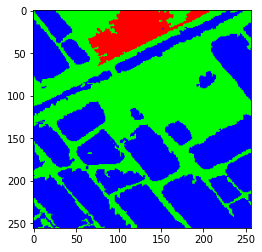

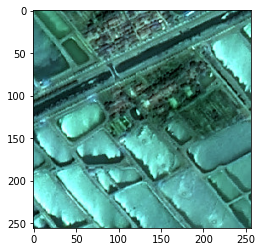

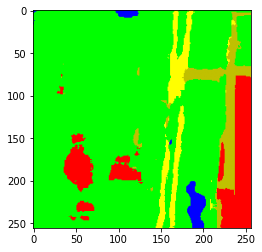

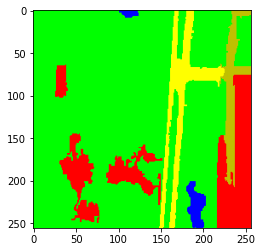

...

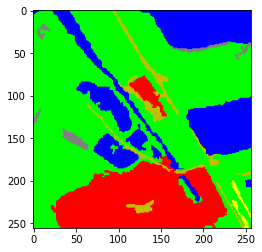

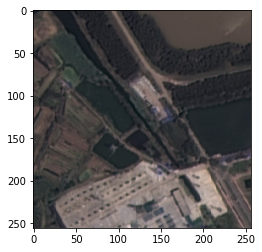

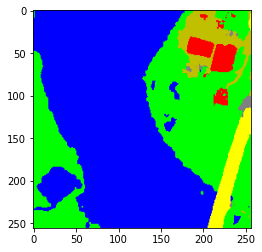

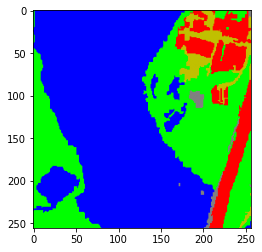

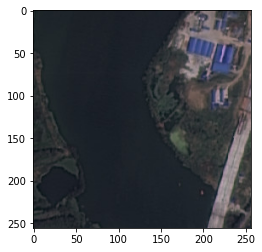

In [ ]:
for i in [1,3,5,13,18,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 256, 256, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = onehot_to_rgb(test_img.reshape((256, 256)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow((onehot_to_rgb(y_test[i,:,:].reshape((256, 256))))/255)

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

Attention UNet

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import math
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K

def AttentionBlock(x,shortcut,i_filters):
    g1 = Conv2D(i_filters,kernel_size = 1)(shortcut) 
    g1 = BatchNormalization()(g1)
    x1 = Conv2D(i_filters,kernel_size = 1)(x) 
    x1 = BatchNormalization()(x1)

    g1_x1 = Add()([g1,x1])
    psi = Activation('relu')(g1_x1)
    psi = Conv2D(1,kernel_size = 1)(psi) 
    psi = BatchNormalization()(psi)
    psi = Activation('sigmoid')(psi)
    x = Multiply()([x,psi])
    return x

def attention_unet():
    seed = 42
    np.random.seed = seed

    IMG_WIDTH = 256
    IMG_HEIGHT = 256
    IMG_CHANNELS = 3

    inputs = Input((IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS))

    conv1 = Conv2D(16, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = Conv2D(16, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    drop5 = Dropout(0.5)(conv5)

    up6 = (UpSampling2D(size = (2,2),interpolation='bilinear')(drop5))
    drop4 = AttentionBlock(drop4,up6,128)
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)

    up7 = (UpSampling2D(size = (2,2),interpolation='bilinear')(conv6))
    conv3 = AttentionBlock(conv3,up7,64)
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)


    up8 = (UpSampling2D(size = (2,2),interpolation='bilinear')(conv7))
    conv2 = AttentionBlock(conv2,up8,32)
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)


    up9 = (UpSampling2D(size = (2,2),interpolation='bilinear')(conv8))
    conv1 = AttentionBlock(conv1,up9,16)
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(16, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    # conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv10 = Conv2D(6, (1, 1), activation='softmax')(conv9)

    model = Model(inputs = inputs, outputs = conv10)

    model.summary()
    return model

model = attention_unet()
flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_42 (Conv2D)              (None, 256, 256, 16) 448         input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_43 (Conv2D)              (None, 256, 256, 16) 2320        conv2d_42[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)  (None, 128, 128, 16) 0           conv2d_43[0][0]                  
____________________________________________________________________________________________

FLOPS: 20083986440


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/whdld_attunet", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save("C:/Users/shyam/Desktop/pri/whdld_attunet")

Epoch 1/100
926/926 [==============================] - 72s 73ms/step - loss: 3.3392 - acc: 0.4996 - val_loss: 0.9622 - val_acc: 0.6293
Epoch 2/100
926/926 [==============================] - 64s 69ms/step - loss: 0.9497 - acc: 0.6431 - val_loss: 0.8723 - val_acc: 0.6757
Epoch 3/100
926/926 [==============================] - 64s 69ms/step - loss: 0.8581 - acc: 0.6762 - val_loss: 1.0602 - val_acc: 0.5988
Epoch 4/100
926/926 [==============================] - 63s 69ms/step - loss: 0.7890 - acc: 0.7029 - val_loss: 0.7727 - val_acc: 0.7075
Epoch 5/100
926/926 [==============================] - 63s 68ms/step - loss: 0.7369 - acc: 0.7215 - val_loss: 0.7396 - val_acc: 0.7225
Epoch 6/100
926/926 [==============================] - 63s 68ms/step - loss: 0.7039 - acc: 0.7366 - val_loss: 0.7131 - val_acc: 0.7366
Epoch 7/100
926/926 [==============================] - 63s 68ms/step - loss: 0.6874 - acc: 0.7434 - val_loss: 0.7247 - val_acc: 0.7234
Epoch 8/100
926/926 [==============================] - 

C:\Users\shyam\anaconda3\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


INFO:tensorflow:Assets written to: C:/Users/shyam/Desktop/pri/whdld_attunet\assets


In [ ]:
y_pred = model.predict(X_test)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(6, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3,4,5]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
classes = [0,1,2,3,4,5]
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.6025987
0.8113051
              precision    recall  f1-score   support

           0       0.65      0.48      0.55   1158900
           1       0.75      0.73      0.74   3717022
           2       0.61      0.58      0.60   3956927
           3       0.72      0.66      0.69   1248215
           4       0.86      0.91      0.88  13318156
           5       0.96      0.94      0.95   3732684

    accuracy                           0.81  27131904
   macro avg       0.76      0.72      0.74  27131904
weighted avg       0.81      0.81      0.81  27131904

k 0.7243889152471148


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.283866011793768, 0.5701735026215662, 0.5349080962196409, 0.5569310114412078, 0.8977829780943289, 0.7391956822829426, 0.5971428804089091]
[[  553943    34748   266250    25094   262975    15890]
 [   18143  2710784   468568    17738   499910     1879]
 [  121729   523100  2296000   158150   849881     8067]
 [   23211    14771   202667   829115   174214     4237]
 [  130464   339246   509101   113571 12108847   116927]
 [    7930     1899     4131     2644   202516  3513564]]
recall [0.4779903356631288, 0.7292891997948896, 0.5802482583075199, 0.6642405354846721, 0.9091984656134078, 0.9412969327165117, 0.7170439545966883]
precision [0.6475684459096116, 0.7478957376202495, 0.6128031554024497, 0.7232891219842417, 0.8588844093238475, 0.959842253816625, 0.7583805206761708]
accuracy [0.966591581630246, 0.9292345277353186, 0.8853142042666817, 0.9728623173663006, 0.8821017131713278, 0.9865059230638586, 0.9371017112056221]
iou [0.37931506727372455, 0.5853831293434851, 0.4245841627148533, 0.52

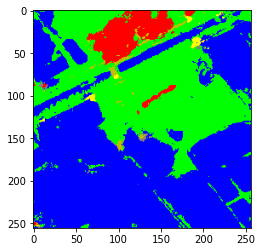

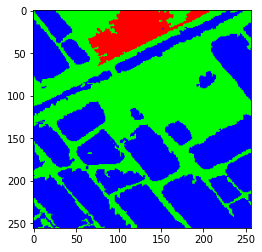

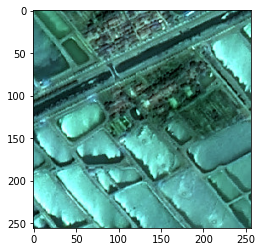

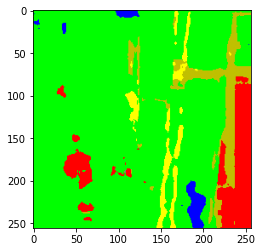

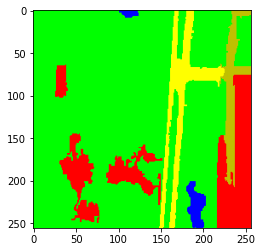

...

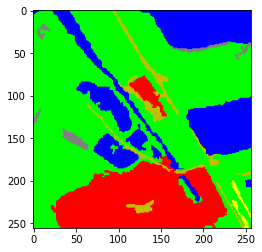

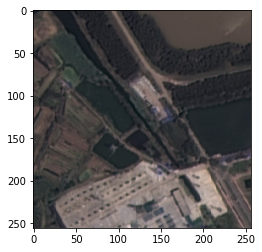

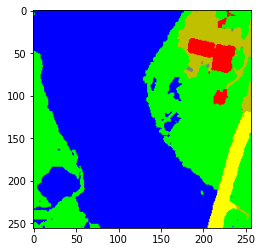

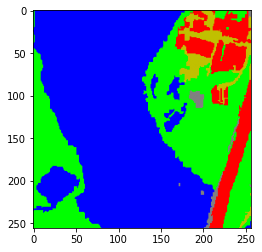

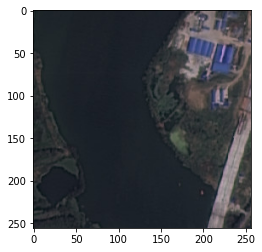

In [ ]:
for i in [1,3,5,13,18,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 256, 256, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = onehot_to_rgb(test_img.reshape((256, 256)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow((onehot_to_rgb(y_test[i,:,:].reshape((256, 256))))/255)

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

UNet SPP

In [ ]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3
from tensorflow.keras.layers import BatchNormalization, Activation, AveragePooling2D


def spp(x):
    pp1 = AveragePooling2D((2,2))(x)
    bn1 = BatchNormalization()(pp1)
    a1  = Activation('relu')(bn1)
    r1  = tf.keras.layers.experimental.preprocessing.Resizing(x.shape[1],x.shape[2])(a1)
    pp2 = AveragePooling2D((7,7))(x)
    bn2 = BatchNormalization()(pp2)
    a2  = Activation('relu')(bn2)
    r2  = tf.keras.layers.experimental.preprocessing.Resizing(x.shape[1],x.shape[2])(a2)
    pp3 = AveragePooling2D((14,14))(x)
    bn3 = BatchNormalization()(pp3)
    a3  = Activation('relu')(bn3)
    r3  = tf.keras.layers.experimental.preprocessing.Resizing(x.shape[1],x.shape[2])(a3)
    c   = concatenate([x,r1,r2,r3])
    return c

inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (inputs)
c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p2)
c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p3)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

p4 = spp(p4)
c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p4)
c5 = Dropout(0.4) (c5)
c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u7)
c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u8)
c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u9)
c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c9)

outputs = Conv2D(6, (1, 1), activation='softmax') (c9)

model = Model(inputs=[inputs], outputs=[outputs])

print(model.summary())

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

The following Variables were used a Lambda layer's call (tf.compat.v1.nn.fused_batch_norm), but
are not present in its tracked objects:
  <tf.Variable 'batch_normalization_133/gamma:0' shape=(128,) dtype=float32>
  <tf.Variable 'batch_normalization_133/beta:0' shape=(128,) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.compat.v1.nn.fused_batch_norm_1), but
are not present in its tracked objects:
  <tf.Variable 'batch_normalization_134/gamma:0' shape=(128,) dtype=float32>
  <tf.Variable 'batch_normalization_134/beta:0' shape=(128,) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables we

FLOPS: 26171215872


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/whdld_unetspp", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save("C:/Users/shyam/Desktop/pri/whdld_unetspp")

Epoch 1/100
926/926 [==============================] - 61s 57ms/step - loss: 4.9091 - acc: 0.4586 - val_loss: 1.4621 - val_acc: 0.4929
Epoch 2/100
926/926 [==============================] - 50s 54ms/step - loss: 1.3487 - acc: 0.5233 - val_loss: 1.1232 - val_acc: 0.5633
Epoch 3/100
926/926 [==============================] - 50s 54ms/step - loss: 1.1220 - acc: 0.5576 - val_loss: 1.1230 - val_acc: 0.5535
Epoch 4/100
926/926 [==============================] - 50s 54ms/step - loss: 1.0541 - acc: 0.5706 - val_loss: 1.0226 - val_acc: 0.6210
Epoch 5/100
926/926 [==============================] - 50s 54ms/step - loss: 0.9816 - acc: 0.6481 - val_loss: 0.9097 - val_acc: 0.6703
Epoch 6/100
926/926 [==============================] - 50s 55ms/step - loss: 0.9239 - acc: 0.6661 - val_loss: 0.8548 - val_acc: 0.6829
Epoch 7/100
926/926 [==============================] - 50s 54ms/step - loss: 0.8312 - acc: 0.6920 - val_loss: 0.8300 - val_acc: 0.6960
Epoch 8/100
926/926 [==============================] - 

926/926 [==============================] - 51s 55ms/step - loss: 0.5037 - acc: 0.8068 - val_loss: 0.5404 - val_acc: 0.7952
Epoch 39/100
926/926 [==============================] - 49s 53ms/step - loss: 0.4963 - acc: 0.8091 - val_loss: 0.5315 - val_acc: 0.7994
Epoch 40/100
926/926 [==============================] - 49s 53ms/step - loss: 0.4921 - acc: 0.8107 - val_loss: 0.5321 - val_acc: 0.7986
Epoch 41/100
926/926 [==============================] - 50s 54ms/step - loss: 0.4950 - acc: 0.8101 - val_loss: 0.5287 - val_acc: 0.8005
Epoch 42/100
926/926 [==============================] - 51s 55ms/step - loss: 0.4933 - acc: 0.8108 - val_loss: 0.5408 - val_acc: 0.7961
Epoch 43/100
926/926 [==============================] - 50s 54ms/step - loss: 0.4995 - acc: 0.8081 - val_loss: 0.5489 - val_acc: 0.7921
Epoch 44/100
926/926 [==============================] - 50s 54ms/step - loss: 0.4953 - acc: 0.8093 - val_loss: 0.5307 - val_acc: 0.7997
Epoch 45/100
926/926 [==============================] - 50s 5

AssertionError: Tried to export a function which references untracked resource Tensor("524247:0", shape=(), dtype=resource). TensorFlow objects (e.g. tf.Variable) captured by functions must be tracked by assigning them to an attribute of a tracked object or assigned to an attribute of the main object directly.

Trackable Python objects referring to this tensor (from gc.get_referrers, limited to two hops):
<tf.Variable 'batch_normalization_135/gamma:0' shape=(128,) dtype=float32>

In [ ]:
y_pred = model.predict(X_test)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(6, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3,4,5]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
classes = [0,1,2,3,4,5]
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.58162576
0.8017771
              precision    recall  f1-score   support

           0       0.65      0.41      0.50   1158900
           1       0.72      0.73      0.73   3717022
           2       0.58      0.58      0.58   3956927
           3       0.68      0.63      0.66   1248215
           4       0.86      0.90      0.88  13318156
           5       0.96      0.94      0.95   3732684

    accuracy                           0.80  27131904
   macro avg       0.74      0.70      0.72  27131904
weighted avg       0.80      0.80      0.80  27131904

k 0.7114634867140353


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.24115953753309835, 0.5794101241342108, 0.5508108630368842, 0.5444405484679249, 0.887737602767831, 0.7594614604380302, 0.5938366893963299]
[[  472667    42210   316884    32138   278818    16183]
 [   11708  2722413   515724    20718   443568     2891]
 [  108792   574091  2282219   175964   803503    12358]
 [   21128    19993   261928   788789   152482     3895]
 [  108861   397649   574373   131561 11989608   116104]
 [    7569     1924     9357     2858   212932  3498044]]
recall [0.40785831391837085, 0.7324177796095906, 0.5767655051508406, 0.6319336011824886, 0.9002453492810867, 0.9371390666876703, 0.6977266026383413]
precision [0.6468466249272983, 0.7243773747565375, 0.5762473535438211, 0.6846960316936741, 0.8637479197150677, 0.9585060864918926, 0.7424035651880486]
accuracy [0.9651962869985092, 0.9251627899022494, 0.8764195096665535, 0.9696790538548271, 0.8813260212036722, 0.9857705894875641, 0.9339257085188959]
iou [0.3335786946402081, 0.572791201309351, 0.40499393720853927, 0

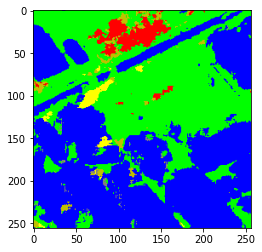

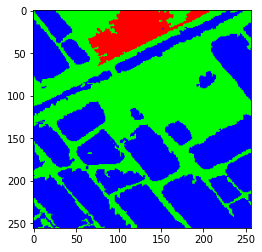

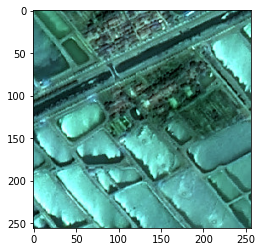

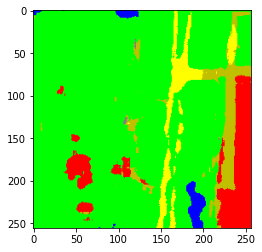

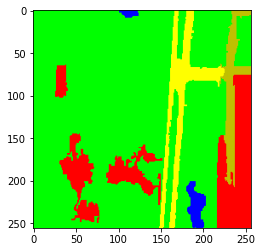

...

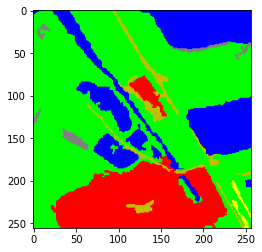

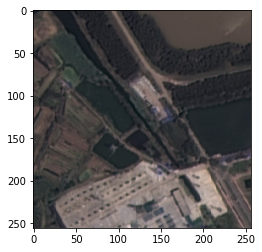

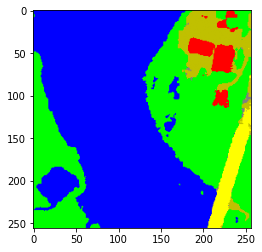

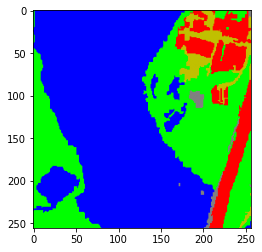

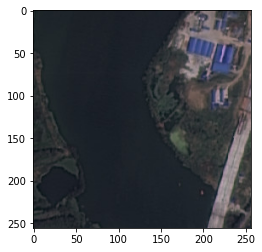

In [ ]:
for i in [1,3,5,13,18,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 256, 256, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = onehot_to_rgb(test_img.reshape((256, 256)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow((onehot_to_rgb(y_test[i,:,:].reshape((256, 256))))/255)

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

FPN

In [ ]:
import numpy as np
from keras import layers
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D, UpSampling2D, Concatenate,Conv2DTranspose
from keras.models import Model, load_model
from keras.preprocessing import image
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from keras.applications.imagenet_utils import preprocess_input

from keras.utils.vis_utils import model_to_dot
# from keras.utils import plot_model

from keras.initializers import glorot_uniform
import scipy.misc


import keras.backend as K
def identity_block(X, f, filters, stage, block):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value. You'll need this later to add back to the main path. 
    X_shortcut = X
    
    # First component of main path
    X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)
    
    # Second component of main path (≈3 lines)
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path (≈2 lines)
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation (≈2 lines)
    X = Add()([X, X_shortcut])
    X = Activation('relu',name = "Relu_"+conv_name_base)(X)      
    return X

def convolutional_block(X, f, filters, stage, block, s = 2):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value
    X_shortcut = X

    ##### MAIN PATH #####
    # First component of main path 
    X = Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    # Second component of main path (≈3 lines)
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path (≈2 lines)
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    ##### SHORTCUT PATH #### (≈2 lines)
    X_shortcut = Conv2D(filters = F3, kernel_size = (1, 1), strides = (s,s), padding = 'valid', name = conv_name_base + '1',
                        kernel_initializer = glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis = 3, name = bn_name_base + '1')(X_shortcut)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation (≈2 lines)
    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)   
    
    return X

def ResNet50(input_shape=(64, 64, 3), classes=4):
    
    # Define the input as a tensor with shape input_shape
    X_input = Input(input_shape)

    # Zero-Padding
    X = ZeroPadding2D((3, 3))(X_input)

    # Stage 1
    X = Conv2D(64, (7, 7), strides=(2, 2), name='conv1', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    # Stage 2
    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')

    ### START CODE HERE ###

    # Stage 3 (≈4 lines)
    X = convolutional_block(X, f = 3, filters = [128, 128, 512], stage = 3, block='a', s = 2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    # Stage 4 (≈6 lines)
    X = convolutional_block(X, f = 3, filters = [256, 256, 1024], stage = 4, block='a', s = 2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')

    # Stage 5 (≈3 lines)
    X = convolutional_block(X, f = 3, filters = [512, 512, 2048], stage = 5, block='a', s = 2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')

    # AVGPOOL (≈1 line). Use "X = AveragePooling2D(...)(X)"
    X = AveragePooling2D((2,2), name="avg_pool")(X)

    ### END CODE HERE ###

    # output layer
    X = Flatten()(X)
    X = Dense(classes, activation='softmax', name='fc' + str(classes), kernel_initializer = glorot_uniform(seed=0))(X)
    
    
    # Create model
    model = Model(inputs = X_input, outputs = X, name='ResNet50')

    return model

def FPN(height, width, channel, classes):    
    resnet50 = ResNet50(input_shape = (height, width, channel), classes = classes )
    #print(resnet50.summary())
    res2 = ZeroPadding2D(padding = ((1,0),(1,0)))(resnet50.get_layer('Relu_res2c_branch').output)
    res3 = resnet50.get_layer('Relu_res3d_branch').output
    res4 = resnet50.get_layer('Relu_res4f_branch').output
    res5 = resnet50.get_layer('Relu_res5c_branch').output
    print(res2.shape,res3.shape,res4.shape,res5.shape)
    dec4_1 = Conv2D(256,3,padding = 'same')(res5)  
    
    dec3 = UpSampling2D(2)(dec4_1)
    dec3_1 = Conv2D(256,1,padding = 'same')(res4)
    dec3_2 = Add()([dec3,dec3_1])
    print(dec3.shape,dec3_1.shape)
    
    dec2 = UpSampling2D(2)(dec3_2)
    dec2_1 = Conv2D(256,1,padding = 'same')(res3)
    print(dec2.shape,dec2_1.shape)
    dec2_2 = Add()([dec2,dec2_1]) 
    
    dec1 = UpSampling2D(2)(dec2_2)
    dec1_1 = Conv2D(256,1,padding = 'same')(res2)
    print(dec1.shape,dec1_1.shape)
    dec1_2 = Add()([dec1,dec1_1]) 
    
    dec4_3 = Conv2D(128,3,strides = 1,activation = 'relu', padding = 'same')(dec4_1)
    dec4_4 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec4_3)
    up_4 = UpSampling2D(8)(dec4_4)
    
    dec3_3 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec3_2)
    dec3_4 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec3_3)
    up_3 = UpSampling2D(4)(dec3_4)
    
    dec2_3 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec2_2)
    dec2_4 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec2_3)
    up_2 = UpSampling2D(2)(dec2_4)
    
    dec1_3 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec1_2)
    dec1_4 = Conv2D(128,3,strides =1,activation = 'relu', padding = 'same')(dec1_3)
    
    
    up = Concatenate()([up_4,up_3,up_2,dec1_4])
    
    final_3 = Conv2DTranspose(128,3,strides =2,activation = 'relu', padding = 'same')(up)
    final_2 = Conv2DTranspose(64,3,strides = 2,activation = 'relu', padding = 'same')(final_3)
    final_1 = Conv2D(classes,1,strides =1,activation = 'softmax', padding = 'same')(final_2)
    
    model = Model(inputs = [resnet50.input],outputs = [final_1])
    # opt = Adam(learning_rate=0.001)
    # model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model
NumChannels = 3
ImgHeight = 256
ImgWidth = 256
NumClass = 6

model = FPN(ImgHeight, ImgWidth, NumChannels, NumClass)
model.summary()

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

(None, 64, 64, 256) (None, 32, 32, 512) (None, 16, 16, 1024) (None, 8, 8, 2048)
(None, 16, 16, 256) (None, 16, 16, 256)
(None, 32, 32, 256) (None, 32, 32, 256)
(None, 64, 64, 256) (None, 64, 64, 256)
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 128, 128, 64) 9472        zero_padding2d[0][0]             
__________________________________________________________________________________________

FLOPS: 94801796876


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/whdld_fpn", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save_weights("C:/Users/shyam/Desktop/pri/whdld_fpn.h5")

Epoch 1/100
926/926 [==============================] - 194s 195ms/step - loss: 1.3196 - acc: 0.5014 - val_loss: 1.2962 - val_acc: 0.5580
Epoch 2/100
926/926 [==============================] - 176s 190ms/step - loss: 1.0127 - acc: 0.6225 - val_loss: 0.8362 - val_acc: 0.6827
Epoch 3/100
926/926 [==============================] - 175s 189ms/step - loss: 0.8467 - acc: 0.6852 - val_loss: 0.7484 - val_acc: 0.7245
Epoch 4/100
926/926 [==============================] - 174s 188ms/step - loss: 0.8582 - acc: 0.6789 - val_loss: 0.8682 - val_acc: 0.6746
Epoch 5/100
926/926 [==============================] - 174s 188ms/step - loss: 0.7670 - acc: 0.7142 - val_loss: 0.7711 - val_acc: 0.7109
Epoch 6/100
926/926 [==============================] - 175s 189ms/step - loss: 0.6985 - acc: 0.7384 - val_loss: 0.7360 - val_acc: 0.7378
Epoch 7/100
926/926 [==============================] - 175s 189ms/step - loss: 0.6877 - acc: 0.7433 - val_loss: 0.6677 - val_acc: 0.7601
Epoch 8/100
926/926 [====================

In [ ]:
y_pred = model.predict(X_test)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(6, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3,4,5]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
classes = [0,1,2,3,4,5]
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.58738345
0.800124
              precision    recall  f1-score   support

           0       0.61      0.47      0.53   1158900
           1       0.76      0.69      0.72   3717022
           2       0.59      0.58      0.59   3956927
           3       0.61      0.77      0.68   1248215
           4       0.86      0.89      0.88  13318156
           5       0.93      0.94      0.94   3732684

    accuracy                           0.80  27131904
   macro avg       0.73      0.72      0.72  27131904
weighted avg       0.80      0.80      0.80  27131904

k 0.7109180585370577


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.2564493852112588, 0.5329156225639937, 0.5296943641059396, 0.6637617895763337, 0.870310085242733, 0.7080510641688703, 0.5935303851448549]
[[  548236    32950   285150    61052   208982    22530]
 [   23243  2547587   553880    37190   548522     6600]
 [  135527   462891  2285896   287826   775655     9132]
 [   15107     7637   137471   958432   125515     4053]
 [  173530   286053   590169   211036 11842060   215308]
 [    3715     1077     2873     4875   193466  3526678]]
recall [0.47306583829493487, 0.6853838906522479, 0.5776947616167799, 0.767842078488081, 0.8891666383844731, 0.9448102223493872, 0.7229939049643174]
precision [0.6095859490881274, 0.7631630267255208, 0.5929016125011963, 0.6142176644486613, 0.8647500401629887, 0.9319232270371728, 0.7294235866606112]
accuracy [0.9645514741611941, 0.9277587374627302, 0.8805622340400437, 0.9671323472175045, 0.8773312775985055, 0.982912035955899, 0.9333746844059796]
iou [0.36306490898808097, 0.565172163642535, 0.41362678165266437, 0.5

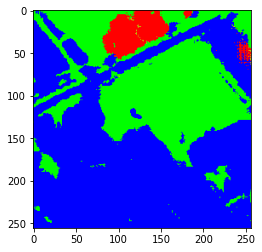

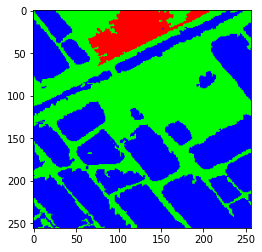

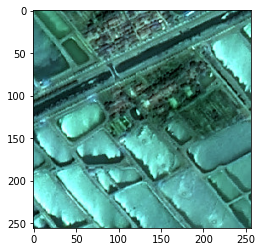

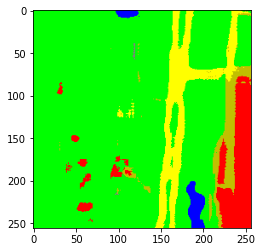

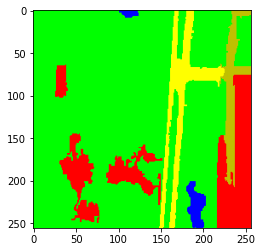

...

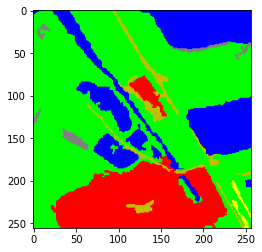

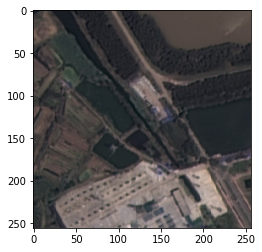

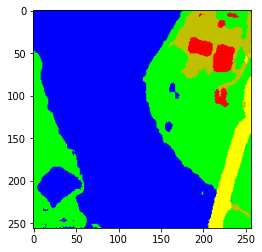

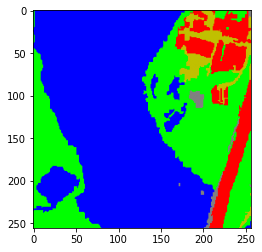

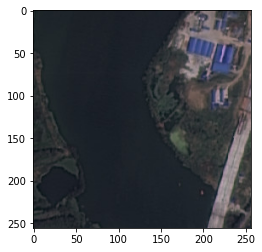

In [ ]:
for i in [1,3,5,13,18,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 256, 256, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = onehot_to_rgb(test_img.reshape((256, 256)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow((onehot_to_rgb(y_test[i,:,:].reshape((256, 256))))/255)

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

UNet

In [ ]:
# UNet model
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3
num_classes = 6
inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

c1 = Conv2D(16, (3, 3), activation='relu',  padding='same') (inputs)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(16, (3, 3), activation='relu', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(32, (3, 3), activation='relu',  padding='same') (p1)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(32, (3, 3), activation='relu',  padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='relu', padding='same') (p2)
c3 = Dropout(0.2) (c3)
c3 = Conv2D(64, (3, 3), activation='relu',  padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(128, (3, 3), activation='relu',  padding='same') (p3)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(128, (3, 3), activation='relu',  padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = Conv2D(256, (3, 3), activation='relu',  padding='same') (p4)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(256, (3, 3), activation='relu',  padding='same') (c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(128, (3, 3), activation='relu', padding='same') (u6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(128, (3, 3), activation='relu', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='relu', padding='same') (u7)
c7 = Dropout(0.2) (c7)
c7 = Conv2D(64, (3, 3), activation='relu', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='relu', padding='same') (u8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(32, (3, 3), activation='relu', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='relu', padding='same') (u9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(16, (3, 3), activation='relu', padding='same') (c9)

outputs = Conv2D(num_classes, (1, 1), activation='softmax') (c9)
model = Model(inputs=[inputs], outputs=[outputs])
print(model.summary())

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_56 (Conv2D)              (None, 256, 256, 16) 448         input_3[0][0]                    
__________________________________________________________________________________________________
dropout_3 (Dropout)             (None, 256, 256, 16) 0           conv2d_56[0][0]                  
__________________________________________________________________________________________________
conv2d_57 (Conv2D)              (None, 256, 256, 16) 2320        dropout_3[0][0]                  
____________________________________________________________________________________________

FLOPS: 24358944768


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/whdld_unet", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save_weights("C:/Users/shyam/Desktop/pri/whdld_unet.h5")

Epoch 1/100
926/926 [==============================] - 54s 56ms/step - loss: 1.5684 - acc: 0.4912 - val_loss: 1.1550 - val_acc: 0.6115
Epoch 2/100
926/926 [==============================] - 51s 55ms/step - loss: 0.8748 - acc: 0.6658 - val_loss: 0.9216 - val_acc: 0.6398
Epoch 3/100
926/926 [==============================] - 50s 54ms/step - loss: 0.8009 - acc: 0.7005 - val_loss: 0.7629 - val_acc: 0.7113
Epoch 4/100
926/926 [==============================] - 50s 54ms/step - loss: 0.7593 - acc: 0.7150 - val_loss: 0.7447 - val_acc: 0.7170
Epoch 5/100
926/926 [==============================] - 50s 54ms/step - loss: 0.7248 - acc: 0.7304 - val_loss: 0.7577 - val_acc: 0.7185
Epoch 6/100
926/926 [==============================] - 50s 54ms/step - loss: 0.7081 - acc: 0.7342 - val_loss: 0.6783 - val_acc: 0.7440
Epoch 7/100
926/926 [==============================] - 50s 54ms/step - loss: 0.6984 - acc: 0.7385 - val_loss: 0.6587 - val_acc: 0.7528
Epoch 8/100
926/926 [==============================] - 


Epoch 00038: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
Epoch 39/100
926/926 [==============================] - 50s 54ms/step - loss: 0.5153 - acc: 0.8038 - val_loss: 0.5202 - val_acc: 0.8039
Epoch 40/100
926/926 [==============================] - 50s 54ms/step - loss: 0.5069 - acc: 0.8067 - val_loss: 0.5314 - val_acc: 0.8002
Epoch 41/100
926/926 [==============================] - 51s 55ms/step - loss: 0.5075 - acc: 0.8060 - val_loss: 0.5253 - val_acc: 0.8016
Epoch 42/100
926/926 [==============================] - 50s 54ms/step - loss: 0.5078 - acc: 0.8059 - val_loss: 0.5192 - val_acc: 0.8034
Epoch 43/100
926/926 [==============================] - 50s 54ms/step - loss: 0.5026 - acc: 0.8080 - val_loss: 0.5216 - val_acc: 0.8036
Epoch 44/100
926/926 [==============================] - 50s 54ms/step - loss: 0.5069 - acc: 0.8061 - val_loss: 0.5170 - val_acc: 0.8046
Epoch 45/100
926/926 [==============================] - 50s 54ms/step - loss: 0.4996 - acc: 0.8089 - v

In [ ]:
y_pred = model.predict(X_test)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(6, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3,4,5]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
classes = [0,1,2,3,4,5]
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.59328794
0.8079435
              precision    recall  f1-score   support

           0       0.62      0.45      0.52   1158900
           1       0.74      0.74      0.74   3717022
           2       0.59      0.59      0.59   3956927
           3       0.71      0.64      0.67   1248215
           4       0.87      0.90      0.88  13318156
           5       0.95      0.95      0.95   3732684

    accuracy                           0.81  27131904
   macro avg       0.75      0.71      0.73  27131904
weighted avg       0.80      0.81      0.81  27131904

k 0.7211308278277306


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.25236579556172317, 0.5723858069999772, 0.5576847059078855, 0.5547539964257626, 0.8857670327342703, 0.7915322658592273, 0.6024149339148076]
[[  522905    39732   274215    23299   277450    21299]
 [   19346  2744753   520976    21063   407550     3334]
 [  145588   523656  2331990   171133   770387    14173]
 [   30012    12473   241768   798040   162127     3795]
 [  112677   400682   561547   112470 11981515   149265]
 [    6541     1894     5402     2883   174123  3541841]]
recall [0.45120804210889637, 0.7384279673351408, 0.5893437003007637, 0.6393449846380631, 0.8996376825740741, 0.9488724467434158, 0.7111391372833923]
precision [0.6246856591272643, 0.7372046551478705, 0.5924924883724121, 0.7069257534848452, 0.8699181567153256, 0.9486124647702672, 0.7466398629363308]
accuracy [0.9649800102491886, 0.9281028710701615, 0.8809945295398361, 0.9712138521498528, 0.8847011252877793, 0.9858945026489847, 0.9359811484909671]
iou [0.35497778779469186, 0.5845547794156013, 0.41935968249372624

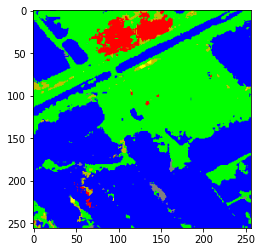

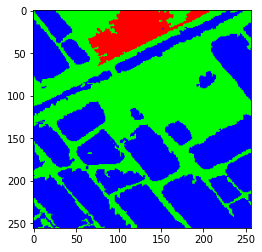

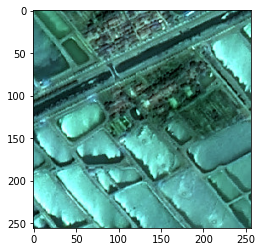

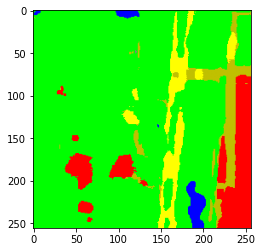

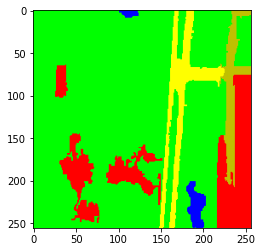

...

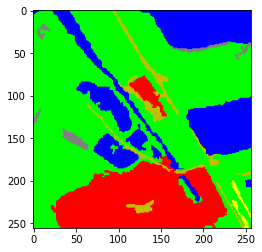

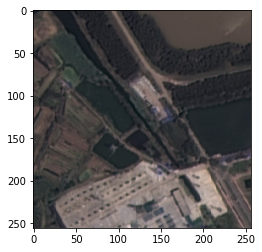

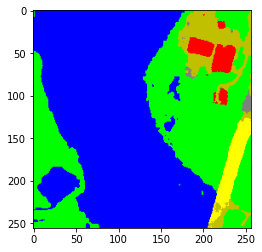

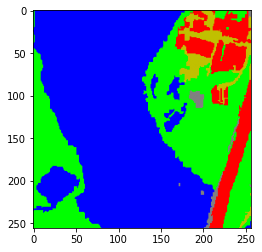

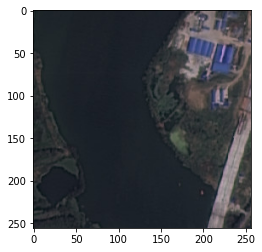

In [ ]:
for i in [1,3,5,13,18,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 256, 256, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = onehot_to_rgb(test_img.reshape((256, 256)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow((onehot_to_rgb(y_test[i,:,:].reshape((256, 256))))/255)

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

DGR

In [ ]:
def dilconv(x,d,f):
  x1 = Conv2D(f,(1,1),dilation_rate=d, padding='same')(x)
  x2 = Conv2D(f,(3,3),dilation_rate=d, padding='same')(x1)
  return x2

def dgspp(x,f):
  x1 = dilconv(x,3,f)
  x11 = x1+x
  x2 = dilconv(x11,6,f)
  x22 = x2+x1+x
  x3 = dilconv(x,12,f)
  x33 = x3+x2+x1+x
  # x4 = tf.math.reduce_mean(x, axis=None)
  x4 = tf.math.reduce_mean(x, axis=1, keepdims=True, name=None)
  x4 = tf.math.reduce_mean(x4, axis=2, keepdims=True, name=None)
  x4 = Conv2D(f,(1,1))(x4)
  x4 = tf.keras.layers.UpSampling2D(size=(16,16), interpolation='bilinear')(x4)
  x = concatenate([x4,x33],axis=3)
  return x

def res(x,f,d):
  x1 = Conv2D(f,(3,3),strides=(d,d),padding='same')(x)
  x2 = Conv2D(f,(1,1))(x1)
  x2 = Conv2D(f,(1,1))(x2)
  x3 = Conv2D(f,(1,1),strides=(d,d))(x)
  x= x2+x3
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  return x

def convset(x,f):
  x1 = Conv2D(f,(1,1))(x)
  x2 = Conv2D(f,(3,3), padding='same')(x1)
  x3 = Conv2D(f,(5,5), padding='same')(x2)
  return x3

from tensorflow.keras.layers import BatchNormalization, Activation, AveragePooling2D, DepthwiseConv2D, Conv2DTranspose
import tensorflow.keras.backend as K 
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import Activation,Reshape, Add, Multiply, DepthwiseConv2D, BatchNormalization, Concatenate, Conv2D, Dense,Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D, Input, Lambda,LeakyReLU, MaxPooling2D, Multiply, Permute, Reshape, UpSampling2D 
import collections
import tensorflow as tf

def dgrmodel(input_size, classes):
   inputs = Input(input_size)
   x1 = Conv2D(16,(7,7),strides=(2,2),padding='same')(inputs)
   r1 = res(x1,64,2)
   r2 = res(r1,128,2)
   r3 = res(r2,256,2)
   d = dgspp(r3,256)
   r4 = res(d,512,2)
   x2 = MaxPooling2D((2,2))(r4)
   conv1 = convset(x2,128)
   x3 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(conv1)
   conv2 = convset(x3,128)
   c1 = concatenate([conv2,r4],axis=3)
   conv3 = Conv2D(512,(7,7),padding='same')(c1)
   r5 = res(conv3,512,1)
   x4 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(r5)
   conv4 = convset(x4,128)
   c2 = concatenate([conv4,r3],axis=3)
   r6 = res(c2,512,1)
   x5 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(r6)
   r2 = Conv2D(512,(1,1))(r2)
   c3 = x5+r2
   r7 = res(c3,256,1)
   x6 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(r7)
   r1 = Conv2D(256,(1,1))(r1)
   c4 = x6+r1
   r8 = res(c4,128,1)
   x7 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(r8)
   x1 = Conv2D(128,(1,1))(x1)
   c5 = x7+x1
   r9 = res(c5,64,1)
   x8 = tf.keras.layers.UpSampling2D(size=(2,2), interpolation='bilinear')(r9)
   r10 = res(x8,16,1)
   x = Conv2D(classes,(1,1),activation='softmax')(r10)  
   model = Model(inputs, x)
   return model

model = dgrmodel((256,256,3), 6)

model.summary()

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_187 (Conv2D)             (None, 128, 128, 16) 2368        input_8[0][0]                    
__________________________________________________________________________________________________
conv2d_188 (Conv2D)             (None, 64, 64, 64)   9280        conv2d_187[0][0]                 
__________________________________________________________________________________________________
conv2d_189 (Conv2D)             (None, 64, 64, 64)   4160        conv2d_188[0][0]                 
____________________________________________________________________________________________

FLOPS: 69947368462


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/whdld_dgr", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save_weights("C:/Users/shyam/Desktop/pri/whdld_dgr.h5")

Epoch 1/100
926/926 [==============================] - 166s 174ms/step - loss: 1.0802 - acc: 0.5983 - val_loss: 0.9509 - val_acc: 0.6456
Epoch 2/100
926/926 [==============================] - 158s 171ms/step - loss: 0.9277 - acc: 0.6514 - val_loss: 0.7847 - val_acc: 0.7114
Epoch 3/100
926/926 [==============================] - 156s 169ms/step - loss: 0.8935 - acc: 0.6653 - val_loss: 0.7997 - val_acc: 0.7115
Epoch 4/100
926/926 [==============================] - 157s 169ms/step - loss: 0.8522 - acc: 0.6824 - val_loss: 0.8623 - val_acc: 0.6774
Epoch 5/100
926/926 [==============================] - 157s 169ms/step - loss: 0.8400 - acc: 0.6881 - val_loss: 0.7554 - val_acc: 0.7168
Epoch 6/100
926/926 [==============================] - 156s 169ms/step - loss: 0.8069 - acc: 0.7013 - val_loss: 0.8396 - val_acc: 0.6816
Epoch 7/100
926/926 [==============================] - 156s 169ms/step - loss: 0.7939 - acc: 0.7070 - val_loss: 0.7906 - val_acc: 0.6989
Epoch 8/100
926/926 [====================

926/926 [==============================] - 157s 169ms/step - loss: 0.6116 - acc: 0.7716 - val_loss: 0.5960 - val_acc: 0.7776
Epoch 38/100
926/926 [==============================] - 157s 170ms/step - loss: 0.6111 - acc: 0.7720 - val_loss: 0.5920 - val_acc: 0.7785
Epoch 39/100
926/926 [==============================] - 156s 169ms/step - loss: 0.6127 - acc: 0.7714 - val_loss: 0.5934 - val_acc: 0.7784
Epoch 40/100
926/926 [==============================] - 156s 169ms/step - loss: 0.6089 - acc: 0.7720 - val_loss: 0.5842 - val_acc: 0.7808
Epoch 41/100
926/926 [==============================] - 157s 170ms/step - loss: 0.6077 - acc: 0.7729 - val_loss: 0.5926 - val_acc: 0.7777
Epoch 42/100
926/926 [==============================] - 157s 170ms/step - loss: 0.6091 - acc: 0.7720 - val_loss: 0.5855 - val_acc: 0.7805
Epoch 43/100
926/926 [==============================] - 157s 169ms/step - loss: 0.6094 - acc: 0.7722 - val_loss: 0.5910 - val_acc: 0.7788
Epoch 44/100
926/926 [=========================

In [ ]:
y_pred = model.predict(X_test)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(6, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3,4,5]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
classes = [0,1,2,3,4,5]
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.54683435
0.7820803
              precision    recall  f1-score   support

           0       0.69      0.37      0.48   1158900
           1       0.70      0.68      0.69   3717022
           2       0.55      0.57      0.56   3956927
           3       0.60      0.57      0.58   1248215
           4       0.85      0.90      0.87  13318156
           5       0.95      0.91      0.93   3732684

    accuracy                           0.78  27131904
   macro avg       0.72      0.66      0.69  27131904
weighted avg       0.78      0.78      0.78  27131904

k 0.6814831969085939


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.22024761158160872, 0.5391047713287348, 0.5592774294753425, 0.4767067424067231, 0.8749891815140125, 0.6532389053878593, 0.5539274402823801]
[[  426565    41517   355330    29243   290390    15855]
 [    6855  2516361   584918    48013   554901     5974]
 [   70696   592401  2242154   220506   819057    12113]
 [   13434    29752   316185   709405   173690     5749]
 [   96311   388427   598313   166483 11922234   146388]
 [    3322     3783     9402     3682   309884  3402611]]
recall [0.3680774872724135, 0.6769830794652278, 0.5666402235876477, 0.568335583212828, 0.8951865408394375, 0.91157220916638, 0.6644658539239892]
precision [0.6911483303979533, 0.7044208383476926, 0.5460275449784259, 0.6025530606489928, 0.8473419910909303, 0.9481484887242977, 0.7232733756980488]
accuracy [0.965982741203861, 0.9168307170775778, 0.8680917859653344, 0.9628947161246038, 0.8693846181970863, 0.9809761968787741, 0.9273601292412063]
iou [0.31608692881458417, 0.5272182416483724, 0.3851786826316445, 0.41

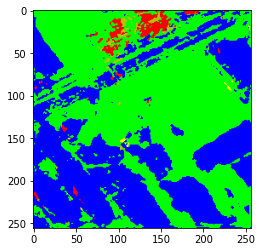

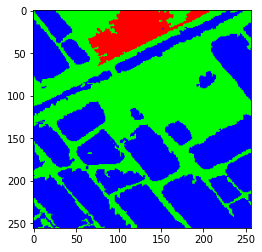

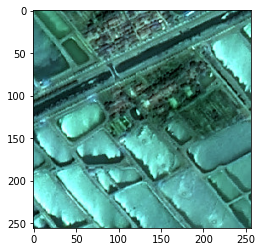

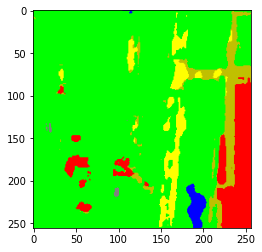

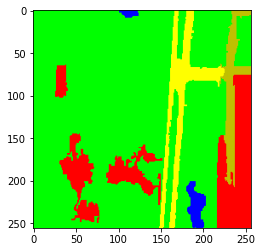

...

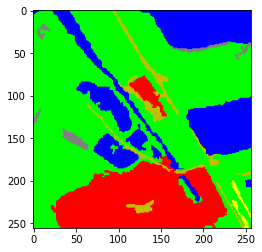

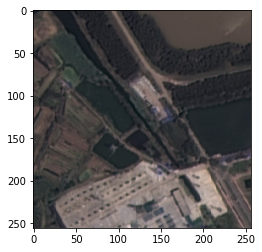

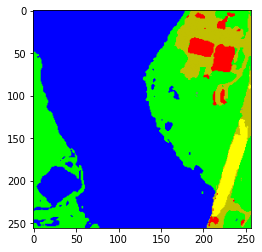

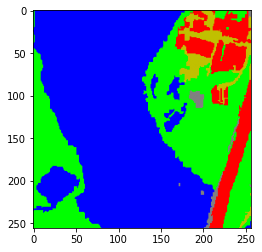

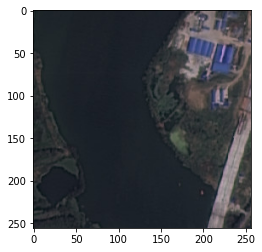

In [ ]:
for i in [1,3,5,13,18,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 256, 256, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = onehot_to_rgb(test_img.reshape((256, 256)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow((onehot_to_rgb(y_test[i,:,:].reshape((256, 256))))/255)

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

Proposed Variant 0

In [ ]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, UpSampling2D, Concatenate, Input
from tensorflow.keras.models import Model

def batchnorm_relu(inputs):
     x = BatchNormalization()(inputs)
     x = Activation("relu")(x)
     return x

def residual_block(inputs, num_filters, strides=1):
     x = batchnorm_relu(inputs)
     x = Conv2D(num_filters, 3, padding="same", strides=strides)(x)
     x = batchnorm_relu(x)
     x = Conv2D(num_filters, 3, padding="same", strides=1)(x)
     s = Conv2D(num_filters, 1, padding="same", strides=strides)(inputs)
     x = x + s
     return x

def decoder_block(inputs, skip_features, num_filters):
    x = UpSampling2D((2, 2))(inputs) 
    x = Concatenate()([x, skip_features]) 
    x = residual_block(x, num_filters, strides=1) 
    return x

def build_resunet(input_shape):
    inputs = Input(input_shape)
    x = Conv2D(64, 3, padding="same", strides=1)(inputs) 
    x = batchnorm_relu(x) 
    x = Conv2D(64, 3, padding="same", strides=1)(x) 
    s = Conv2D(64, 1, padding="same")(inputs) 
    s1 = x + s
    s2 = residual_block(s1, 128, strides=2)
    s3 = residual_block(s2, 256, strides=2)
    b = residual_block(s3, 512, strides=2) 
    x = decoder_block(b, s3, 256) 
    x = decoder_block(x, s2, 128) 
    x = decoder_block(x, s1, 64)
    outputs = Conv2D(6, 1, padding="same", activation="softmax")(x)
    model = Model(inputs, outputs, name="RESUNET")
    return model

shape = (256,256, 3)
model = build_resunet(shape)
model.summary()


flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

Model: "RESUNET"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_59 (Conv2D)              (None, 256, 256, 64) 1792        input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_92 (BatchNo (None, 256, 256, 64) 256         conv2d_59[0][0]                  
__________________________________________________________________________________________________
activation_92 (Activation)      (None, 256, 256, 64) 0           batch_normalization_92[0][0]     
____________________________________________________________________________________________

FLOPS: 362177101830


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/whdld_proposed_variant_0", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save("C:/Users/shyam/Desktop/pri/whdld_proposed_variant_0")

Epoch 1/100
926/926 [==============================] - 314s 335ms/step - loss: 2.8083 - acc: 0.5609 - val_loss: 1.1392 - val_acc: 0.6130
Epoch 2/100
926/926 [==============================] - 307s 331ms/step - loss: 1.0317 - acc: 0.6450 - val_loss: 0.8158 - val_acc: 0.7062
Epoch 3/100
926/926 [==============================] - 306s 331ms/step - loss: 0.8728 - acc: 0.6851 - val_loss: 0.7835 - val_acc: 0.7206
Epoch 4/100
926/926 [==============================] - 306s 330ms/step - loss: 0.7611 - acc: 0.7217 - val_loss: 0.9150 - val_acc: 0.6981
Epoch 5/100
926/926 [==============================] - 306s 330ms/step - loss: 0.7213 - acc: 0.7375 - val_loss: 0.6626 - val_acc: 0.7516
Epoch 6/100
926/926 [==============================] - 306s 330ms/step - loss: 0.6878 - acc: 0.7470 - val_loss: 0.6224 - val_acc: 0.7672
Epoch 7/100
926/926 [==============================] - 307s 331ms/step - loss: 0.6520 - acc: 0.7594 - val_loss: 0.6106 - val_acc: 0.7724
Epoch 8/100
926/926 [====================

In [ ]:
y_pred = model.predict(X_test)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(6, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3,4,5]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
classes = [0,1,2,3,4,5]
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.5984245
0.80812734
              precision    recall  f1-score   support

           0       0.57      0.55      0.56   1158900
           1       0.74      0.74      0.74   3717022
           2       0.64      0.51      0.57   3956927
           3       0.72      0.67      0.69   1248215
           4       0.85      0.91      0.88  13318156
           5       0.96      0.94      0.95   3732684

    accuracy                           0.81  27131904
   macro avg       0.75      0.72      0.73  27131904
weighted avg       0.80      0.81      0.80  27131904

k 0.7192427184322415


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.4174953609929927, 0.596404812226083, 0.47823606567735627, 0.5935550921251977, 0.9041992501973348, 0.7719519461823283, 0.6269737545668822]
[[  635254    46847   229502    30349   198902    18046]
 [   20121  2744336   393043    19952   536679     2891]
 [  178597   571096  2029903   161739  1007933     7659]
 [   24985    15825   203208   832976   166712     4509]
 [  247666   326955   335284   110347 12170480   127424]
 [    7955     8295     2634     2798   197915  3513087]]
recall [0.5481525584606092, 0.738315780751365, 0.5129998607505268, 0.667333752598711, 0.913826208372991, 0.9411691426330222, 0.7202995505945374]
precision [0.5699502412572292, 0.7390450789232591, 0.6356210941096089, 0.719222975044057, 0.8523568207321982, 0.9563021829173218, 0.7454163988306123]
accuracy [0.963033556362281, 0.9284346575898249, 0.8860863211074314, 0.9727102086163949, 0.8800004231181122, 0.9859897042242225, 0.9360424785030445]
iou [0.38776992645694364, 0.5856407542402541, 0.3964191291720225, 0.5294

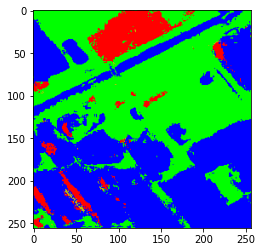

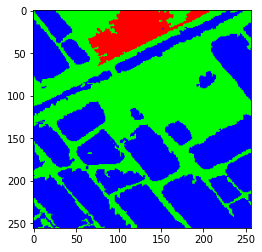

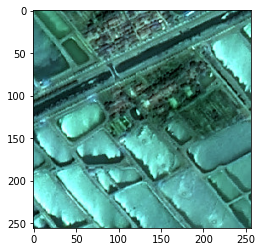

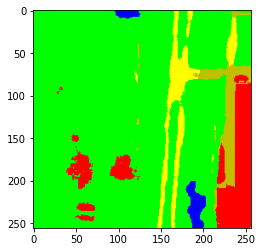

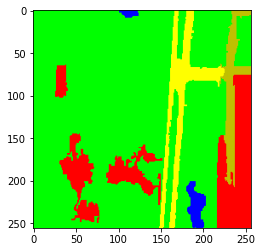

...

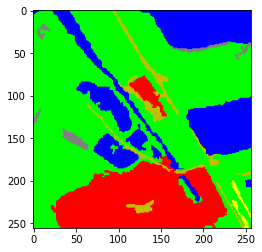

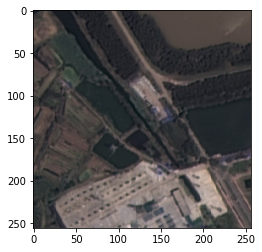

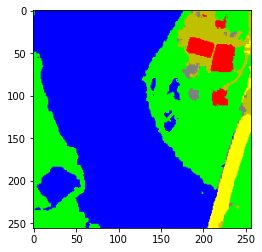

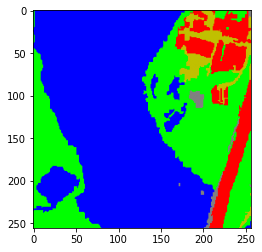

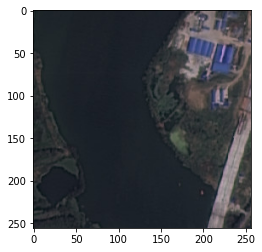

In [ ]:
for i in [1,3,5,13,18,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 256, 256, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = onehot_to_rgb(test_img.reshape((256, 256)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow((onehot_to_rgb(y_test[i,:,:].reshape((256, 256))))/255)

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

Proposed Variant 1

In [ ]:
import tensorflow as tf

import numpy as np
from keras.backend import int_shape
from keras.models import Model
from keras.layers import *
from tensorflow.keras import regularizers
import tensorflow as tf

def dilconv(x,d,f):
  x1 = Conv2D(f,(1,1),dilation_rate=d)(x)
  x2 = Conv2D(f,(3,3),dilation_rate=d, padding='same')(x1)
  return x2

def dgspp(x,f):
  x1 = dilconv(x,7,f)
  x11 = x1+x
  x2 = dilconv(x11,14,f)
  x22 = x2+x1+x
  x3 = dilconv(x,21,f)
  x33 = x3+x2+x1+x
  # x4 = tf.math.reduce_mean(x, axis=None)
  x4 = tf.math.reduce_mean(x, axis=1, keepdims=True, name=None)
  x4 = tf.math.reduce_mean(x4, axis=2, keepdims=True, name=None)
  x4 = Conv2D(f,(1,1))(x4)
  x4 = tf.keras.layers.UpSampling2D(size=(64,64), interpolation='bilinear')(x4)
  x = concatenate([x4,x33],axis=3)
  return x

from tensorflow.keras import layers
from tensorflow import keras

img_size = (256,256)

def downblock(filters, filter_size, previous_layer):
  x = layers.Conv2D(filters, filter_size, padding="same")(previous_layer)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)

  x = layers.Conv2D(filters, filter_size, padding="same")(x)
  x = layers.BatchNormalization()(x)
  
  residual = layers.Conv2D(filters, 1, padding="same")(previous_layer)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual

  x = layers.Activation("relu")(x)
  p = layers.MaxPooling2D(2)(x)

  return x,p

def bottleneck(filters, filter_size, previous_layer):
  x = layers.Conv2D(filters, filter_size, padding="same")(previous_layer)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)
  x = layers.Conv2D(filters, filter_size, padding="same")(x)

  residual = layers.Conv2D(filters, 1, padding="same")(previous_layer)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual
  
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)

  return x

def upblock(filters, filter_size, previous_layer, layer_to_concat):
  x = layers.Conv2DTranspose(filters, filter_size, strides=2, padding="same")(previous_layer)       #upconvolution
  concat = layers.concatenate([x, layer_to_concat])                                                      #concatenation

  x = layers.Conv2D(filters, filter_size, padding="same")(concat)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)
  x = layers.Conv2D(filters, filter_size, padding="same")(x)
  x = layers.BatchNormalization()(x)

  residual = layers.Conv2D(filters, 1, padding="same")(concat)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual
  
  x = layers.Activation("relu")(x)

  return x

input_layer = layers.Input(shape = img_size + (3,))

conv1, pool1 = downblock(32, 3, input_layer)
conv2, pool2 = downblock(64, 3, pool1)
conv3, pool3 = downblock(128, 3, pool2)
tower_1 = Conv2D(256, (1,1), padding='same', activation='relu')(pool3)
tower_1 = Conv2D(256, (3,3), padding='same', activation='relu')(tower_1)
tower_2 = Conv2D(256, (1,1), padding='same', activation='relu')(pool3)
tower_2 = Conv2D(256, (5,5), padding='same', activation='relu')(tower_2)
tower_3 = MaxPooling2D((3,3), strides=(1,1), padding='same')(pool3)
tower_3 = Conv2D(256, (1,1), padding='same', activation='relu')(tower_3)
conv4 = keras.layers.concatenate([tower_1, tower_2, tower_3], axis = 3)

upconv1 = upblock(128, 3, conv4, conv3)
upconv2 = upblock(64, 3, upconv1, conv2)
upconv3 = upblock(32, 3, upconv2, conv1)

output_layer = layers.Conv2D(6, 1, padding="same", activation='softmax')(upconv3)
model = keras.Model(input_layer, output_layer)
model.summary()

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

The following Variables were used a Lambda layer's call (tf.nn.convolution_38), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_71/kernel:0' shape=(1, 1, 128, 256) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.nn.bias_add_56), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_71/bias:0' shape=(256,) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.nn.convolution_39), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_72/kernel:0' shape=(3, 3, 256, 256) dtype=float32>
It is possible that this is

FLOPS: 98451324928


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/whdld_proposed_variant_1", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save_weights("C:/Users/shyam/Desktop/pri/whdld_proposed_variant_1.h5")

Epoch 1/100
926/926 [==============================] - 124s 131ms/step - loss: 1.2090 - acc: 0.6144 - val_loss: 1.0266 - val_acc: 0.6011
Epoch 2/100
926/926 [==============================] - 120s 130ms/step - loss: 0.7932 - acc: 0.7035 - val_loss: 0.9401 - val_acc: 0.6590
Epoch 3/100
926/926 [==============================] - 120s 130ms/step - loss: 0.7054 - acc: 0.7359 - val_loss: 0.9468 - val_acc: 0.6314
Epoch 4/100
926/926 [==============================] - 119s 129ms/step - loss: 0.6760 - acc: 0.7457 - val_loss: 0.7163 - val_acc: 0.7357
Epoch 5/100
926/926 [==============================] - 134s 145ms/step - loss: 0.6673 - acc: 0.7488 - val_loss: 0.6564 - val_acc: 0.7537
Epoch 6/100
926/926 [==============================] - 149s 161ms/step - loss: 0.6300 - acc: 0.7621 - val_loss: 0.6639 - val_acc: 0.7517
Epoch 7/100
926/926 [==============================] - 399s 431ms/step - loss: 0.6181 - acc: 0.7667 - val_loss: 0.7168 - val_acc: 0.7279
Epoch 8/100
926/926 [====================


Epoch 00037: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
Epoch 38/100
926/926 [==============================] - 121s 130ms/step - loss: 0.4016 - acc: 0.8435 - val_loss: 0.4741 - val_acc: 0.8207
Epoch 39/100
926/926 [==============================] - 120s 130ms/step - loss: 0.3998 - acc: 0.8442 - val_loss: 0.4737 - val_acc: 0.8207
Epoch 40/100
926/926 [==============================] - 121s 131ms/step - loss: 0.3994 - acc: 0.8444 - val_loss: 0.4747 - val_acc: 0.8202
Epoch 41/100
926/926 [==============================] - 120s 130ms/step - loss: 0.3994 - acc: 0.8444 - val_loss: 0.4753 - val_acc: 0.8203
Epoch 42/100
926/926 [==============================] - 121s 131ms/step - loss: 0.3989 - acc: 0.8445 - val_loss: 0.4750 - val_acc: 0.8200
Restoring model weights from the end of the best epoch.

Epoch 00042: ReduceLROnPlateau reducing learning rate to 1e-05.
Epoch 00042: early stopping


In [ ]:
y_pred = model.predict(X_test)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(6, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3,4,5]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
classes = [0,1,2,3,4,5]
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.6161191
0.81935304
              precision    recall  f1-score   support

           0       0.62      0.51      0.56   1158900
           1       0.74      0.77      0.75   3717022
           2       0.64      0.57      0.60   3956927
           3       0.70      0.72      0.71   1248215
           4       0.87      0.91      0.89  13318156
           5       0.96      0.95      0.96   3732684

    accuracy                           0.82  27131904
   macro avg       0.76      0.74      0.75  27131904
weighted avg       0.81      0.82      0.82  27131904

k 0.7376199300086181


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.2786344714284306, 0.5943979401592278, 0.5174819613472066, 0.6089165833852351, 0.9019639722006682, 0.7925800889518058, 0.6156625029120958]
[[  588274    36596   201229    37048   277859    17894]
 [   23027  2843987   434560    16592   396202     2654]
 [  187697   522715  2253934   194941   789854     7786]
 [   20723    13324   163779   903001   143912     3476]
 [  120344   403251   469917   132750 12093893    98001]
 [    9651     1832     3220     2441   168021  3547519]]
recall [0.5076141168349296, 0.7651251458829138, 0.5696172812892429, 0.7234338635571597, 0.9080756374981641, 0.9503936041732973, 0.7373766082059513]
precision [0.6194209637407393, 0.7441670667934861, 0.6391167340915812, 0.7017562538225468, 0.8719624252536511, 0.9646996598075234, 0.7568538505849213]
accuracy [0.9656467898456371, 0.9317868366333597, 0.8903247630538572, 0.9731317787354695, 0.889424973639889, 0.9883909363677537, 0.9397843463793277]
iou [0.38693530797675785, 0.6057815768285357, 0.4309928499749122, 0.

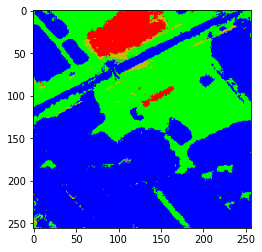

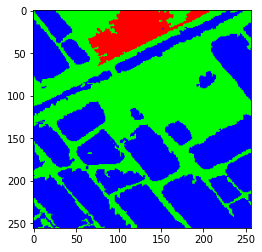

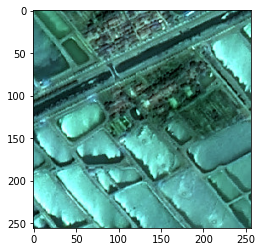

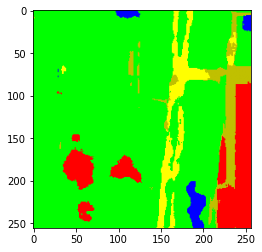

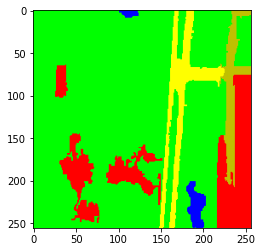

...

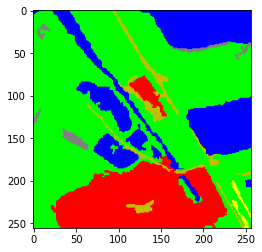

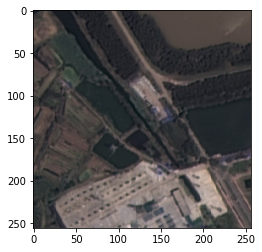

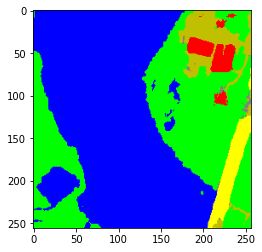

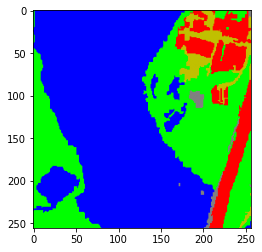

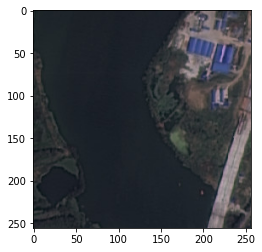

In [ ]:
for i in [1,3,5,13,18,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 256, 256, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = onehot_to_rgb(test_img.reshape((256, 256)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow((onehot_to_rgb(y_test[i,:,:].reshape((256, 256))))/255)

    plt.figure()
    plt.imshow(X_test[i, :, :, :])

DIResUNet

In [ ]:
import tensorflow as tf

import numpy as np
from keras.backend import int_shape
from keras.models import Model
from keras.layers import *
from tensorflow.keras import regularizers
import tensorflow as tf

def dilconv(x,d,f):
  x1 = Conv2D(f,(1,1),dilation_rate=d)(x)
  x2 = Conv2D(f,(3,3),dilation_rate=d, padding='same')(x1)
  return x2

def dgspp(x,f):
  x1 = dilconv(x,7,f)
  x11 = x1+x
  x2 = dilconv(x11,14,f)
  x22 = x2+x1+x
  x3 = dilconv(x,21,f)
  x33 = x3+x2+x1+x
  # x4 = tf.math.reduce_mean(x, axis=None)
  x4 = tf.math.reduce_mean(x, axis=1, keepdims=True, name=None)
  x4 = tf.math.reduce_mean(x4, axis=2, keepdims=True, name=None)
  x4 = Conv2D(f,(1,1))(x4)
  x4 = tf.keras.layers.UpSampling2D(size=(64,64), interpolation='bilinear')(x4)
  x = concatenate([x4,x33],axis=3)
  return x

from tensorflow.keras import layers
from tensorflow import keras

img_size = (256,256)

def downblock(filters, filter_size, previous_layer):
  x = layers.Conv2D(filters, filter_size, padding="same")(previous_layer)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)

  x = layers.Conv2D(filters, filter_size, padding="same")(x)
  x = layers.BatchNormalization()(x)
  
  residual = layers.Conv2D(filters, 1, padding="same")(previous_layer)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual

  x = layers.Activation("relu")(x)
  p = layers.MaxPooling2D(2)(x)

  return x,p

def bottleneck(filters, filter_size, previous_layer):
  x = layers.Conv2D(filters, filter_size, padding="same")(previous_layer)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)
  x = layers.Conv2D(filters, filter_size, padding="same")(x)

  residual = layers.Conv2D(filters, 1, padding="same")(previous_layer)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual
  
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)

  return x

def upblock(filters, filter_size, previous_layer, layer_to_concat):
  x = layers.Conv2DTranspose(filters, filter_size, strides=2, padding="same")(previous_layer)       #upconvolution
  concat = layers.concatenate([x, layer_to_concat])                                                      #concatenation

  x = layers.Conv2D(filters, filter_size, padding="same")(concat)
  x = layers.BatchNormalization()(x)
  x = layers.Activation("relu")(x)
  x = layers.Conv2D(filters, filter_size, padding="same")(x)
  x = layers.BatchNormalization()(x)

  residual = layers.Conv2D(filters, 1, padding="same")(concat)      #separate layer for addintion
  x = layers.add([x, residual])  # Add back residual
  
  x = layers.Activation("relu")(x)

  return x

input_layer = layers.Input(shape = img_size + (3,))

conv1, pool1 = downblock(32, 3, input_layer)
conv2, pool2 = downblock(64, 3, pool1)
conv3, pool3 = downblock(128, 3, pool2)
conv3  = dgspp(conv3,128)
tower_1 = Conv2D(256, (1,1), padding='same', activation='relu')(pool3)
tower_1 = Conv2D(256, (3,3), padding='same', activation='relu')(tower_1)
tower_2 = Conv2D(256, (1,1), padding='same', activation='relu')(pool3)
tower_2 = Conv2D(256, (5,5), padding='same', activation='relu')(tower_2)
tower_3 = MaxPooling2D((3,3), strides=(1,1), padding='same')(pool3)
tower_3 = Conv2D(256, (1,1), padding='same', activation='relu')(tower_3)
conv4 = keras.layers.concatenate([tower_1, tower_2, tower_3], axis = 3)

upconv1 = upblock(128, 3, conv4, conv3)
upconv2 = upblock(64, 3, upconv1, conv2)
upconv3 = upblock(32, 3, upconv2, conv1)

output_layer = layers.Conv2D(6, 1, padding="same", activation='softmax')(upconv3)
model = keras.Model(input_layer, output_layer)
model.summary()

flops = get_flops(model, 4)
print(f"FLOPS: {flops}")

The following Variables were used a Lambda layer's call (tf.compat.v1.nn.conv2d_18), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_76/kernel:0' shape=(1, 1, 128, 128) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.nn.bias_add_61), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_76/bias:0' shape=(128,) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.compat.v1.nn.conv2d_19), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_77/kernel:0' shape=(3, 3, 128, 128) dtype=float32>
It is possible th

The following Variables were used a Lambda layer's call (tf.nn.bias_add_71), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_86/bias:0' shape=(256,) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.nn.convolution_48), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_87/kernel:0' shape=(1, 1, 128, 256) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.
The following Variables were used a Lambda layer's call (tf.nn.bias_add_72), but
are not present in its tracked objects:
  <tf.Variable 'conv2d_87/bias:0' shape=(256,) dtype=float32>
It is possible that this is intended behav

FLOPS: 125928374786


In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback

model.compile(optimizer= 'adam', loss= 'sparse_categorical_crossentropy', metrics= ['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
mc = ModelCheckpoint("C:/Users/shyam/Desktop/pri/whdld_DIResUNet", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, verbose=1)
history = model.fit(X_train, y_train,validation_data=(X_test, y_test), epochs=100, batch_size=4, verbose=1, callbacks=[es, mc, lrr])
model.save_weights("C:/Users/shyam/Desktop/pri/whdld_DIResUNet.h5")

Epoch 1/100
926/926 [==============================] - 156s 165ms/step - loss: 1.0133 - acc: 0.6339 - val_loss: 0.9766 - val_acc: 0.6488
Epoch 2/100
926/926 [==============================] - 154s 167ms/step - loss: 0.7364 - acc: 0.7241 - val_loss: 0.8028 - val_acc: 0.7128
Epoch 3/100
926/926 [==============================] - 154s 167ms/step - loss: 0.6780 - acc: 0.7446 - val_loss: 0.7916 - val_acc: 0.7111
Epoch 4/100
926/926 [==============================] - 154s 166ms/step - loss: 0.6456 - acc: 0.7563 - val_loss: 0.6556 - val_acc: 0.7562
Epoch 5/100
926/926 [==============================] - 154s 167ms/step - loss: 0.6267 - acc: 0.7635 - val_loss: 0.7326 - val_acc: 0.7191
Epoch 6/100
926/926 [==============================] - 155s 167ms/step - loss: 0.5938 - acc: 0.7741 - val_loss: 0.5715 - val_acc: 0.7847
Epoch 7/100
926/926 [==============================] - 154s 166ms/step - loss: 0.5817 - acc: 0.7781 - val_loss: 0.5851 - val_acc: 0.7809
Epoch 8/100
926/926 [====================

Epoch 38/100
926/926 [==============================] - 155s 167ms/step - loss: 0.3771 - acc: 0.8525 - val_loss: 0.4772 - val_acc: 0.8208
Epoch 39/100
926/926 [==============================] - 154s 167ms/step - loss: 0.3737 - acc: 0.8537 - val_loss: 0.4797 - val_acc: 0.8217
Epoch 40/100
926/926 [==============================] - 154s 167ms/step - loss: 0.3717 - acc: 0.8545 - val_loss: 0.4792 - val_acc: 0.8211
Epoch 41/100
926/926 [==============================] - 154s 167ms/step - loss: 0.3698 - acc: 0.8553 - val_loss: 0.4780 - val_acc: 0.8225
Epoch 42/100
926/926 [==============================] - 155s 168ms/step - loss: 0.3671 - acc: 0.8562 - val_loss: 0.4829 - val_acc: 0.8221

Epoch 00042: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
Epoch 43/100
926/926 [==============================] - 155s 167ms/step - loss: 0.3594 - acc: 0.8593 - val_loss: 0.4803 - val_acc: 0.8232
Epoch 44/100
926/926 [==============================] - 155s 168ms/step - loss: 0.3589 - a

In [ ]:
y_pred = model.predict(X_test)
from tensorflow.keras.metrics import MeanIoU, Accuracy

meaniou = MeanIoU(6, name=None, dtype=None)
meaniou.update_state(y_test, y_pred.argmax(axis=-1))
print(meaniou.result().numpy())
meaniou.reset_states()

acc = Accuracy()
acc.update_state(y_test, y_pred.argmax(axis=3))
print(acc.result().numpy())
acc.reset_states()

from sklearn.metrics import classification_report
cr = classification_report(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cr)

from sklearn.metrics import cohen_kappa_score
k = cohen_kappa_score(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print("k",k)

classes = [0,1,2,3,4,5]
acc = acc_osegnet(y_test,y_pred,classes)
print(acc)

cm = confusion_matrix(y_test.ravel(), y_pred.argmax(axis=3).ravel())
print(cm)
classes = [0,1,2,3,4,5]
kappa,recall,precision,iou,dice,F1,acc = parameters(cm,classes)
print("recall",recall)
print("precision",precision)
print("accuracy",acc)
print("iou",iou)
print("dice",dice)
print("f1",F1)
print("kappa",kappa)

0.6263574
0.8234381
              precision    recall  f1-score   support

           0       0.63      0.53      0.57   1158900
           1       0.77      0.74      0.76   3717022
           2       0.63      0.62      0.62   3956927
           3       0.72      0.74      0.73   1248215
           4       0.88      0.91      0.89  13318156
           5       0.96      0.95      0.96   3732684

    accuracy                           0.82  27131904
   macro avg       0.76      0.75      0.75  27131904
weighted avg       0.82      0.82      0.82  27131904

k 0.744264618874664


C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shyam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being se

[0.35398205869486843, 0.5859122942576751, 0.5064210408170695, 0.6433846999830043, 0.8954833991259217, 0.779424864494412, 0.6274347262288251]
[[  614578    33327   248563    27166   217842    17424]
 [   21031  2741458   507505    20607   424433     1988]
 [  148569   425152  2453640   176176   745202     8188]
 [   24737    10671   168377   919268   121081     4081]
 [  163908   329327   534321   135405 12055090   100105]
 [    9106     1935     4728     2810   156695  3557410]]
recall [0.5303115022866511, 0.7375415050005085, 0.6200872545791216, 0.7364660735530337, 0.9051620960138926, 0.9530434400554668, 0.7471019785814458]
precision [0.6258884298151903, 0.77401429188536, 0.6263865366872821, 0.7173755610910294, 0.8786289089128457, 0.9642778534943657, 0.7644285969810122]
accuracy [0.9663984879203464, 0.9345428909080616, 0.8906534167303555, 0.9745277367928178, 0.8920710098340315, 0.9886826962088617, 0.9411460397324126]
iou [0.40267164444118303, 0.6068617715278186, 0.45266594605843347, 0.

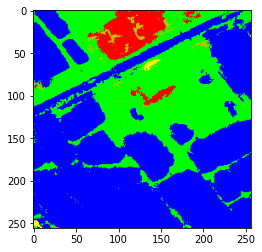

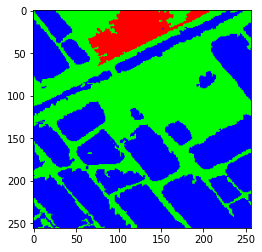

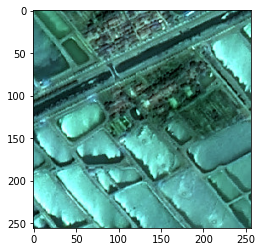

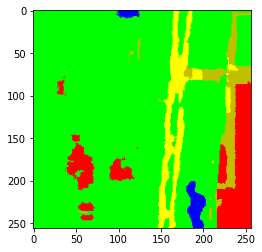

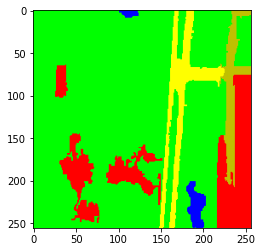

...

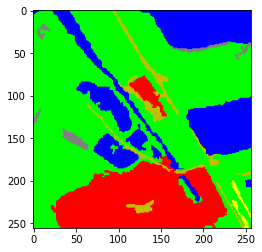

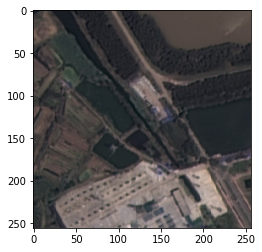

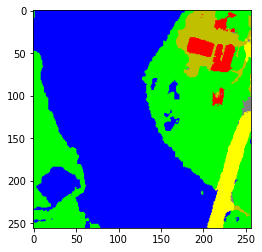

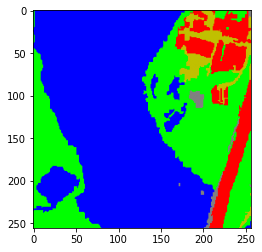

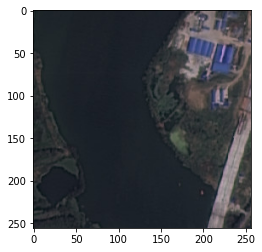

In [ ]:
for i in [1,3,5,13,18,51]:
    test_img = model.predict(X_test[i,:,:,:].reshape((1, 256, 256, 3)))
    test_img = np.argmax(test_img, axis=3)

    # print(y_pred.shape, y_data[i, :, :].shape)

    test_img = onehot_to_rgb(test_img.reshape((256, 256)))
    #test_img_ = plt.imread(y_test[i])

    plt.figure()
    plt.imshow(test_img/255)

    plt.figure()
    plt.imshow((onehot_to_rgb(y_test[i,:,:].reshape((256, 256))))/255)

    plt.figure()
    plt.imshow(X_test[i, :, :, :])